# (30) Sim -- added ```terrain```

**Motivation**: generate figs: flow patterns, PCA, distributions, etc.

- Note: residual sampling is not good. Keep this: **```residual=False```**. <br>

In [1]:
# HIDE CODE


import os, sys
from copy import deepcopy as dc
from os.path import join as pjoin
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-MTMST/_extras')
fig_base_dir = pjoin(git_dir, 'jb-MTMST/figs')
tmp_dir = pjoin(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_MTMST'))
from figures.fighelper import *
from analysis.opticflow import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
# HIDE CODE


def _do_pca(a):
    a = flatten_arr(a, ndim_end=0, ndim_start=1)
    u, s, v = sp_lin.svd(a, full_matrices=False, compute_uv=True)
    s *= 100 / s.sum()
    titles = [f"{e:0.1f} %" for e in s]
    pcs = v.reshape(-1, of.dim, of.dim, 2)
    return s, pcs, titles


def _plot_singular_values(s, thres=90):
    fig, axes = create_figure(2, 1, (13, 7), sharex='all')
    axes[0].plot(s, marker='.')
    axes[1].plot(np.cumsum(s), lw=3, marker=None)

    idx = np.where(np.cumsum(s) > thres)[0][0]
    axes[1].axvline(
        idx, color='g', ls=':', lw=1.5,
        label=f'{idx} dimensions',
    )
    axes[1].axhline(
        thres, color='magenta', ls=':', lw=1.5,
        label=f'{thres}% of variance',
    )
    axes[1].legend()

    axes[1].axhline(0, color='k', ls='--', lw=1.2)
    axes[1].axhline(100, color='k', ls='--', lw=1.2)
    axes[1].set_ylim((-3, 103))
    add_grid(axes)
    plt.show()


def _sizes_hist(of, obj_i: int = 0):
    fig, ax = create_figure(1, 1, (15, 5))
    size_pix = of.objects[obj_i].size * of.dim ** 2
    sns.histplot(size_pix, bins=np.linspace(0, 80, 81) - 0.5, stat='percent', ax=ax)

    for color, thres in zip(['magenta', 'k', 'r'], [2, 4, 8]):
        lbl = f'{100 * (size_pix < thres).sum() / of.n:0.1f}% smaller than {thres} pixels'
        ax.axvline(thres, color=color, ls='--', lw=1.3, label=lbl)
    ax.legend(fontsize=17)
    plt.show()

## Prepare

In [3]:
kws = dict(
    dim=19,
    fov=45.0,
    obj_r=0.2,
    obj_bound=0.97,
    obj_zlim=(0.5, 1.0),
    vlim_obj=(0.01, 5.0),
    vlim_slf=(0.01, 5.0),
    residual=False,
    z_bg=1.0,
    seed=0,
)
print(kws)

min_obj_size = 4

{
    'dim': 19,
    'fov': 45.0,
    'obj_r': 0.2,
    'obj_bound': 0.97,
    'obj_zlim': (0.5, 1.0),
    'vlim_obj': (0.01, 5.0),
    'vlim_slf': (0.01, 5.0),
    'residual': False,
    'z_bg': 1.0,
    'seed': 0
}

## 1. ```Obj```
**Meaning:** Object only, no self motion.

### num objects = 1

In [4]:
%%time

of = OpticFlow(
    category='obj',
    n=int(1.3e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 3min 20s, sys: 17.2 s, total: 3min 37s
Wall time: 2min 1s


In [5]:
accept.sum()

107693

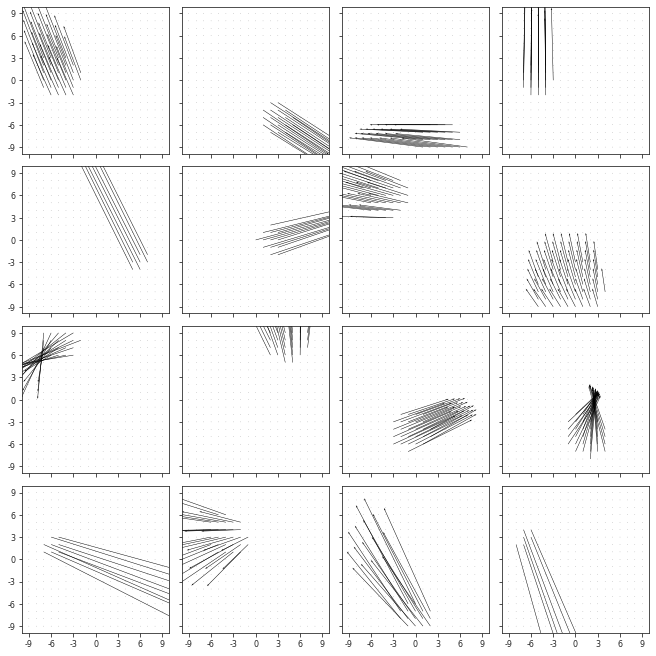

In [6]:
_ = show_opticflow(of.alpha_dot[accept])

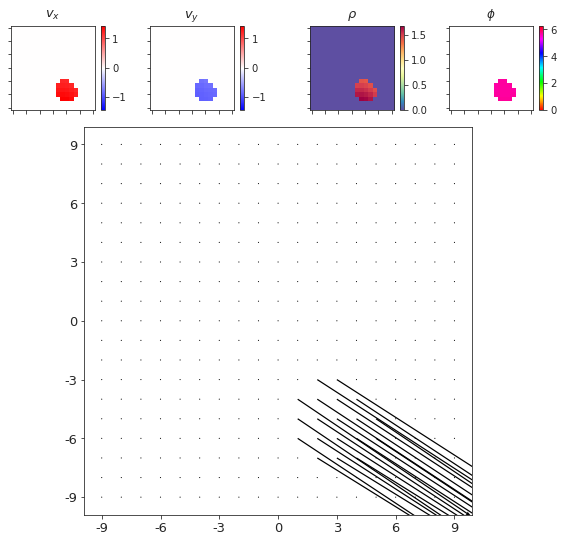

In [7]:
_ = show_opticflow_full(of.alpha_dot[accept][1])

In [8]:
of.objects[0].v[accept][1]

array([ 0.94050443, -0.852233  , -0.48527517])

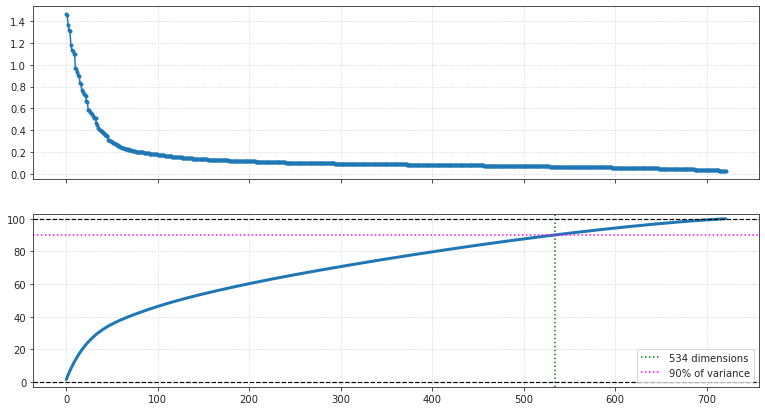

In [9]:
_plot_singular_values(s)

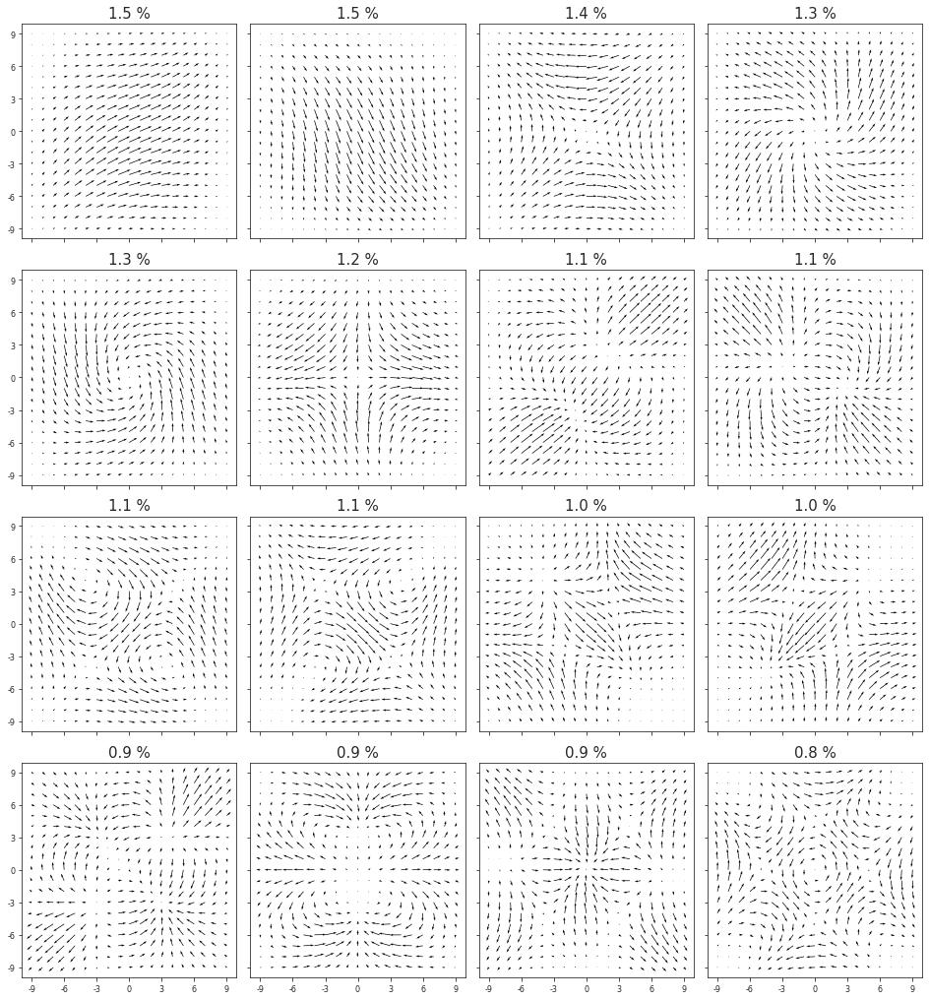

In [10]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

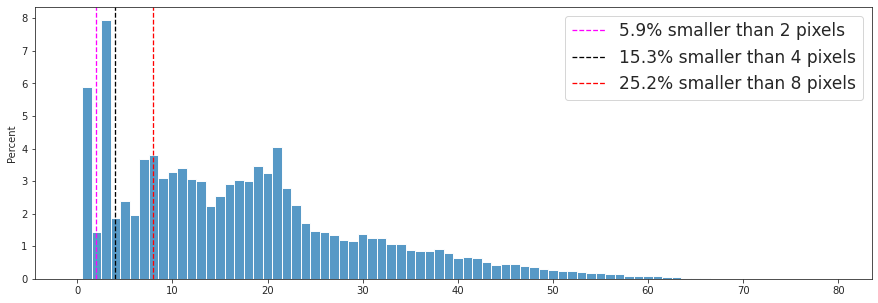

In [11]:
_sizes_hist(of)

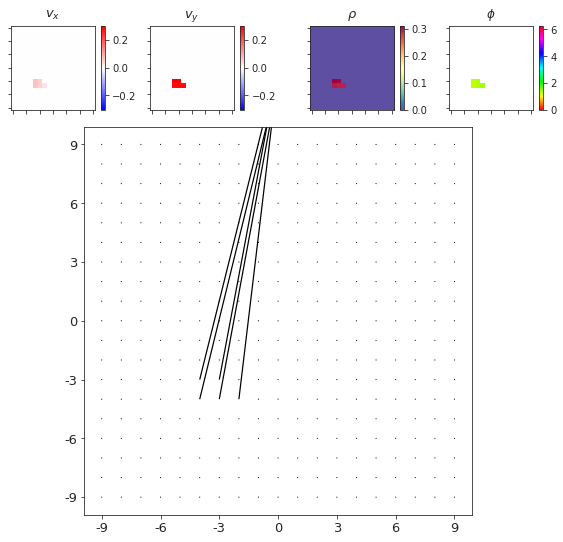

In [12]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

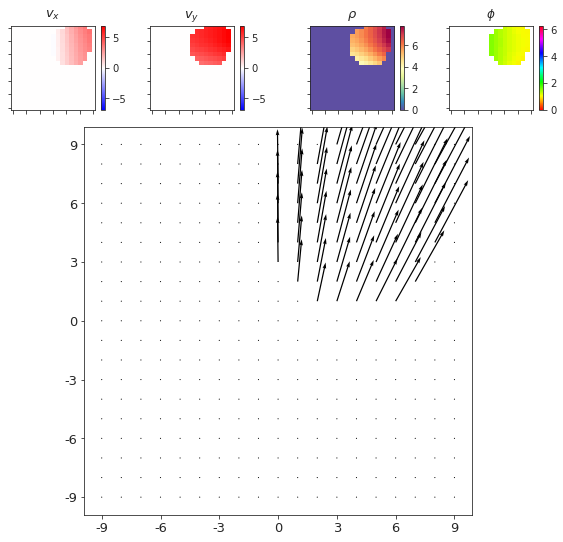

In [13]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

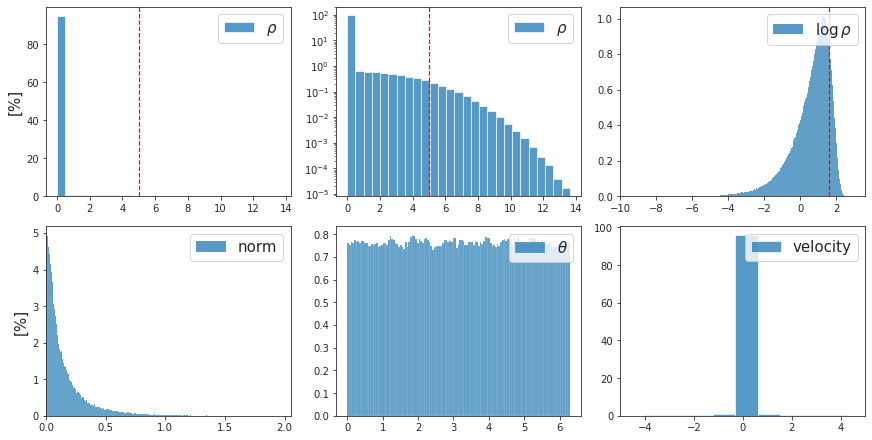

CPU times: user 1min 40s, sys: 16.9 s, total: 1min 57s
Wall time: 1min 57s


In [14]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

### num objects = 4

In [15]:
%%time

of = OpticFlow(
    category='obj',
    n=int(2e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 6min 40s, sys: 22.7 s, total: 7min 3s
Wall time: 5min 30s


In [16]:
accept.sum()

101864

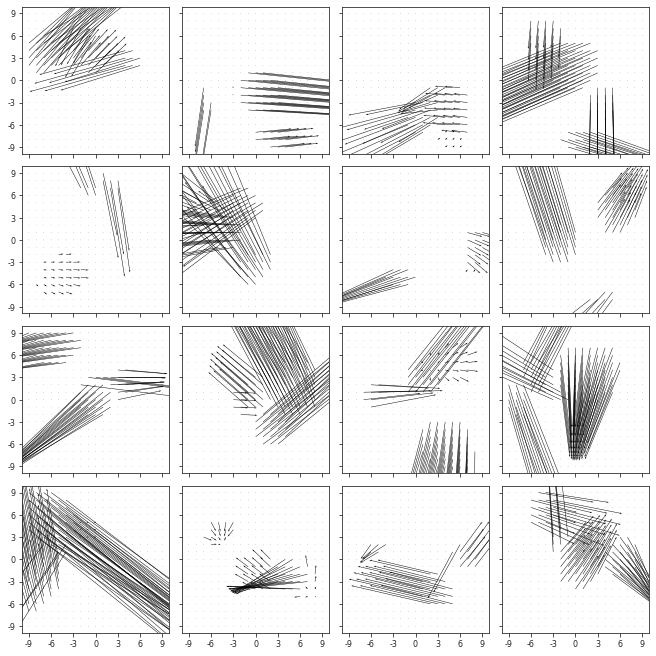

In [17]:
_ = show_opticflow(of.alpha_dot[accept])

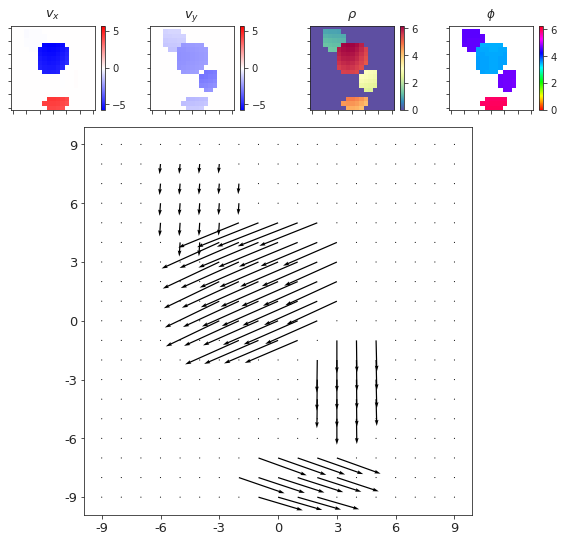

In [18]:
_ = show_opticflow_full(of.alpha_dot[accept][3])

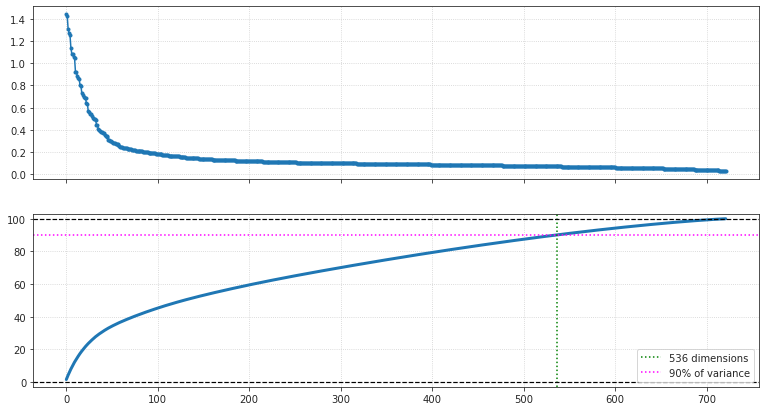

In [19]:
_plot_singular_values(s)

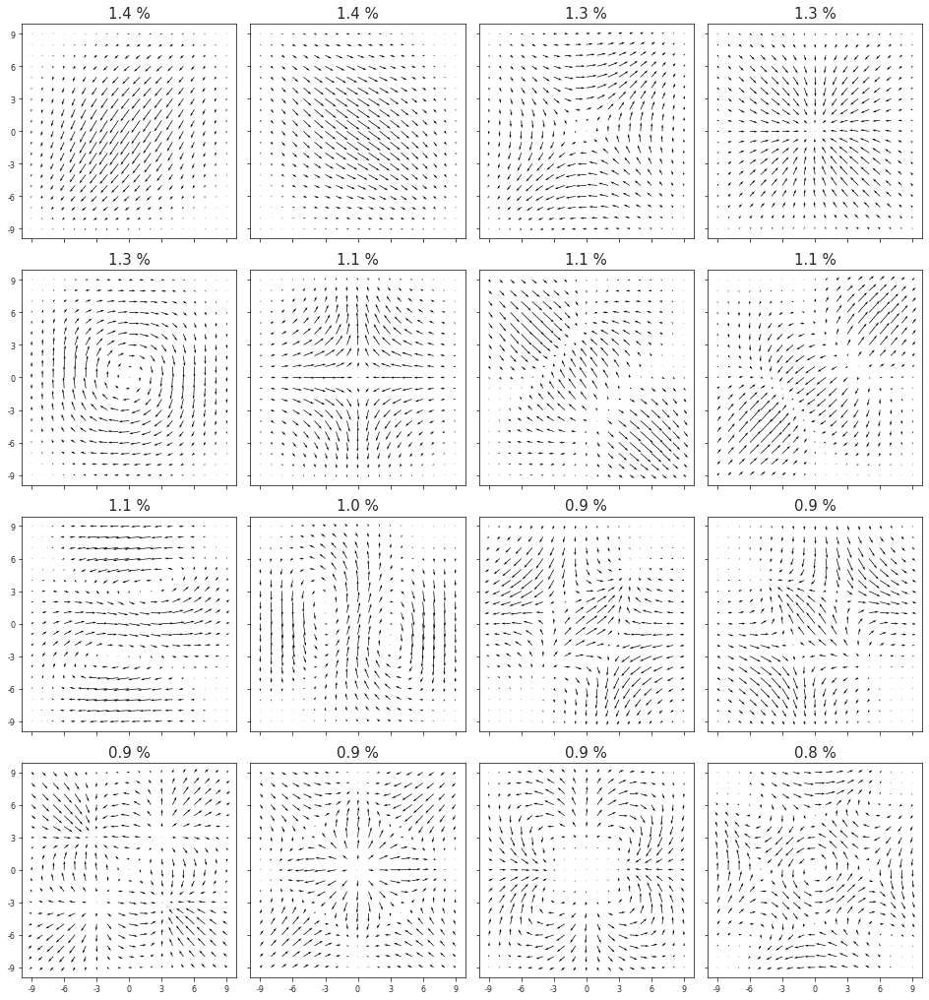

In [20]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

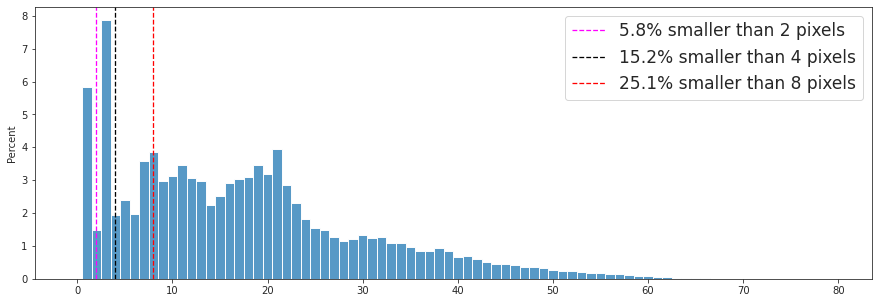

In [21]:
_sizes_hist(of)

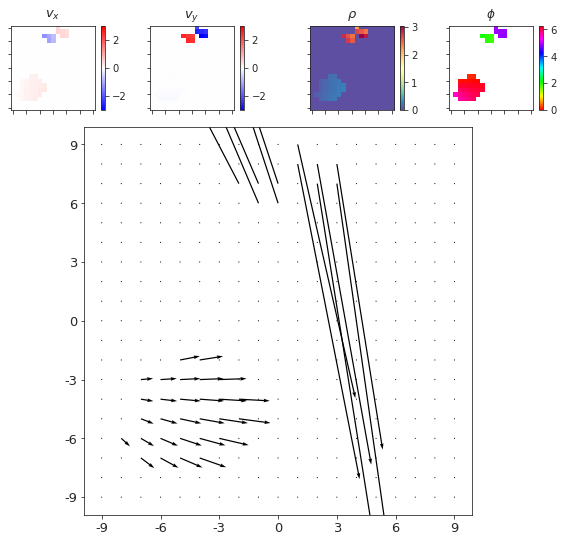

In [22]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

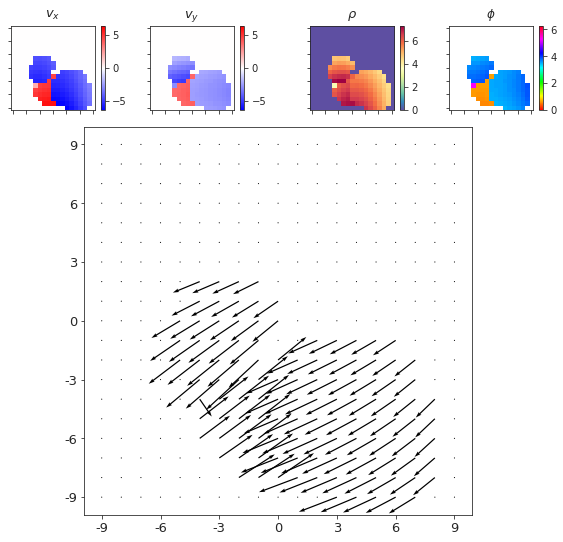

In [23]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

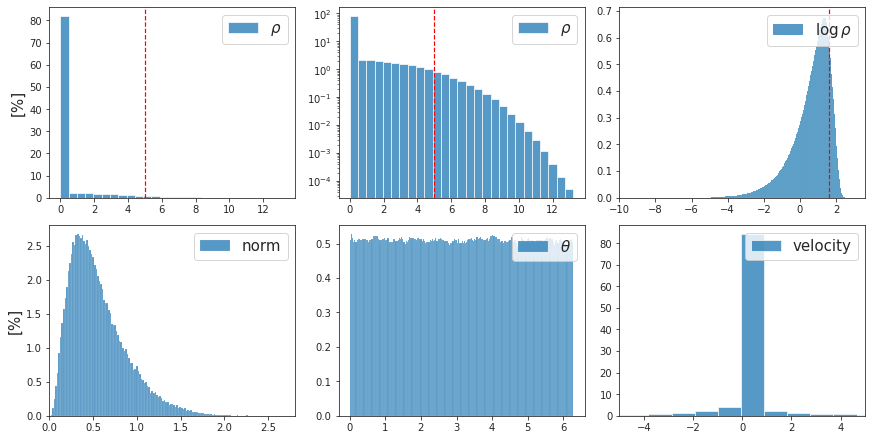

CPU times: user 1min 40s, sys: 17.7 s, total: 1min 58s
Wall time: 1min 58s


In [24]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

## 2. ```Translation```
**Meaning:** Self-motion, translation only (no eye movement = no rotation).

### num objects = 0

In [25]:
%%time

of = OpticFlow(
    category='transl',
    n=int(1e5),
    n_obj=0,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 1min 56s, sys: 12.2 s, total: 2min 8s
Wall time: 44.1 s


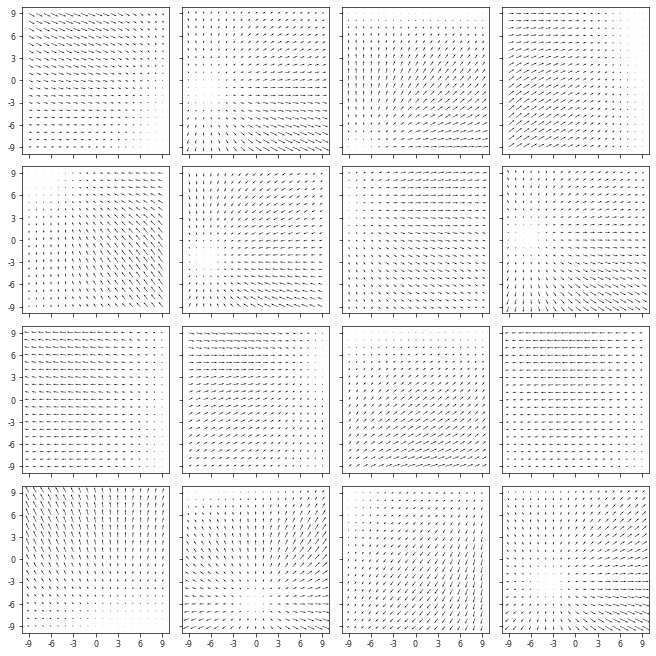

In [26]:
_ = show_opticflow(of.alpha_dot)

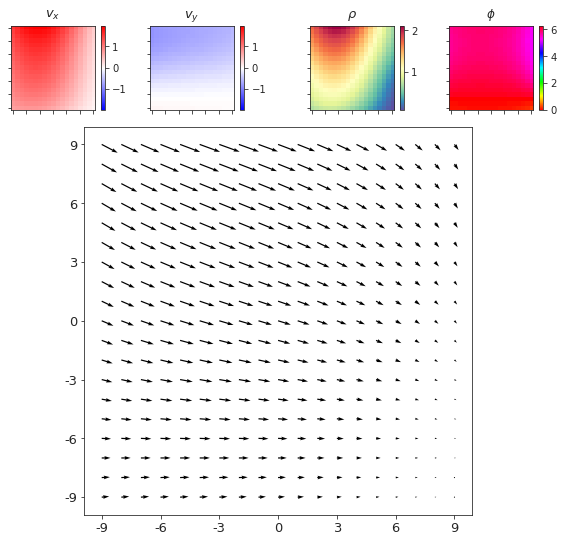

In [27]:
_ = show_opticflow_full(of.alpha_dot[0])

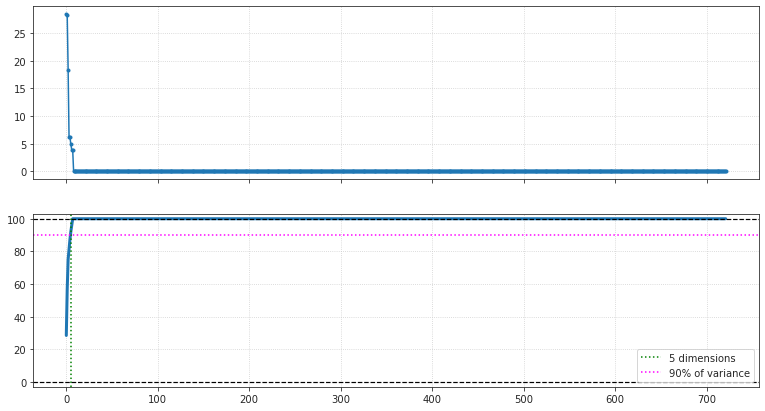

In [28]:
_plot_singular_values(s)

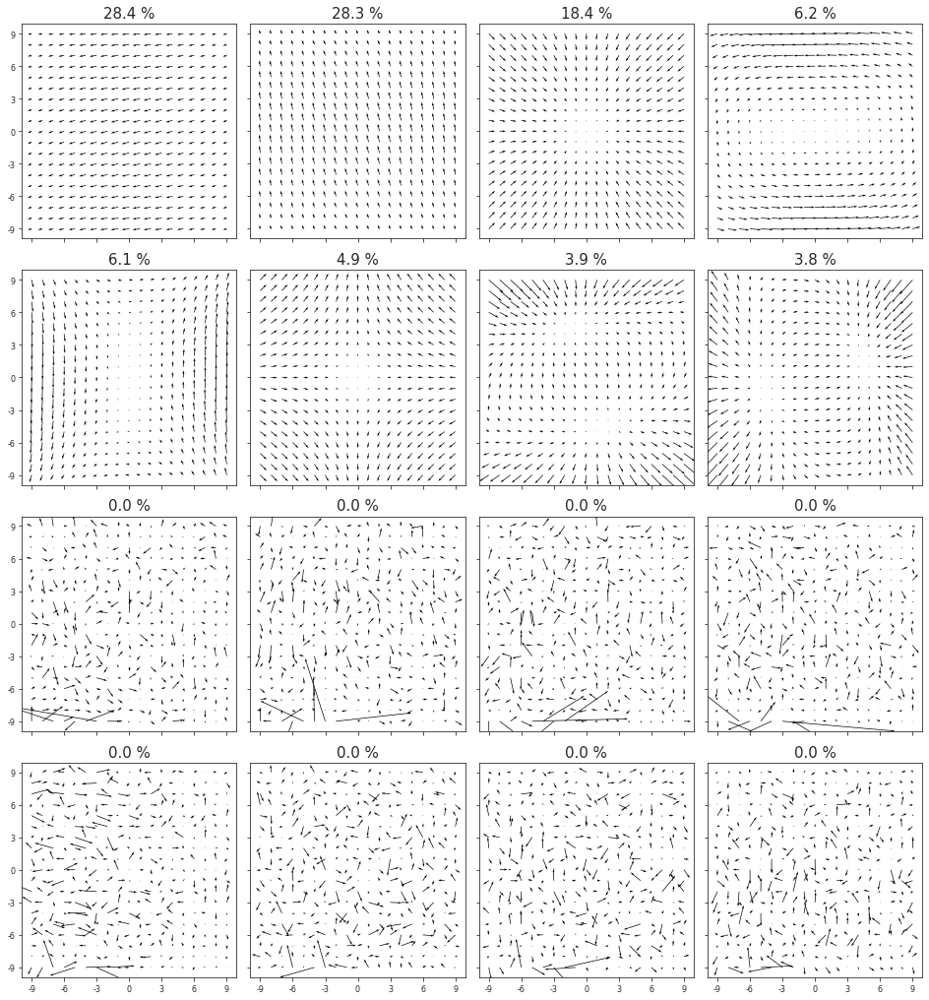

In [29]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

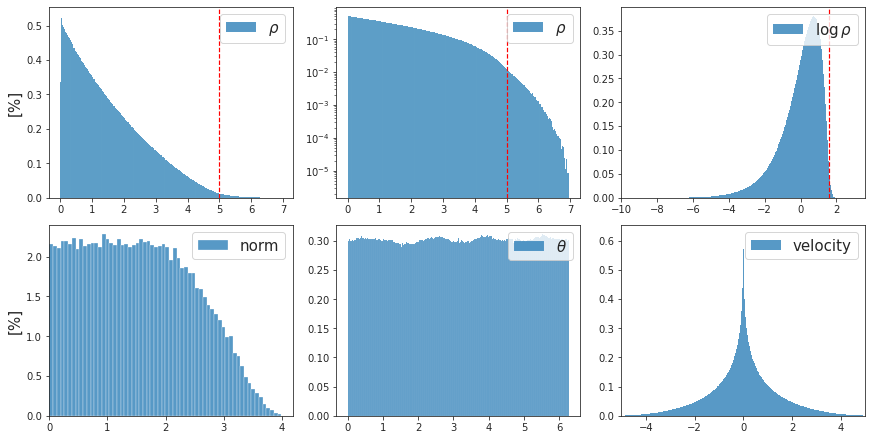

CPU times: user 2min 7s, sys: 22.3 s, total: 2min 29s
Wall time: 2min 29s


In [30]:
%%time

_ = plot_opticflow_hist(of.alpha_dot)

### num objects = 1

In [31]:
%%time

of = OpticFlow(
    category='transl',
    n=int(1.21e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 3min 11s, sys: 17.5 s, total: 3min 28s
Wall time: 2min 2s


In [32]:
accept.sum()

100051

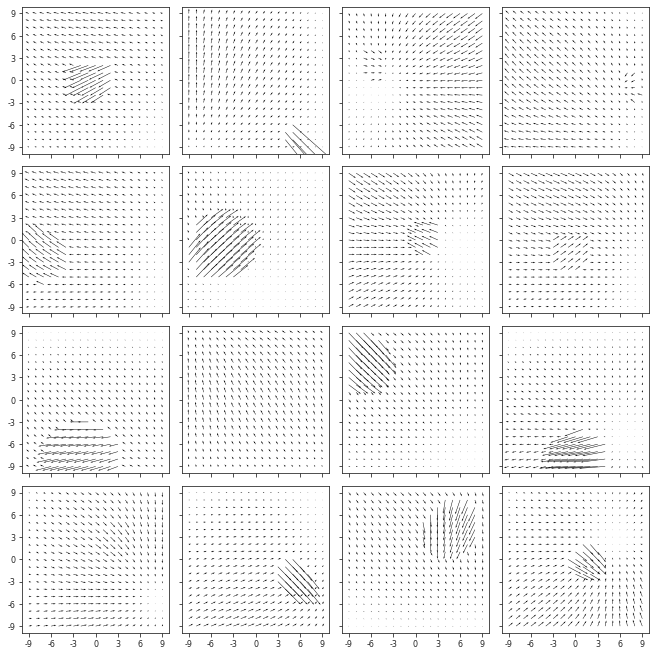

In [33]:
_ = show_opticflow(of.alpha_dot[accept])

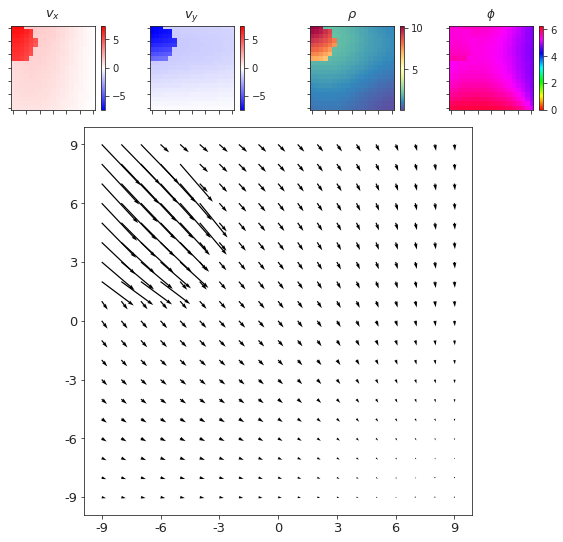

In [34]:
_ = show_opticflow_full(of.alpha_dot[accept][10])

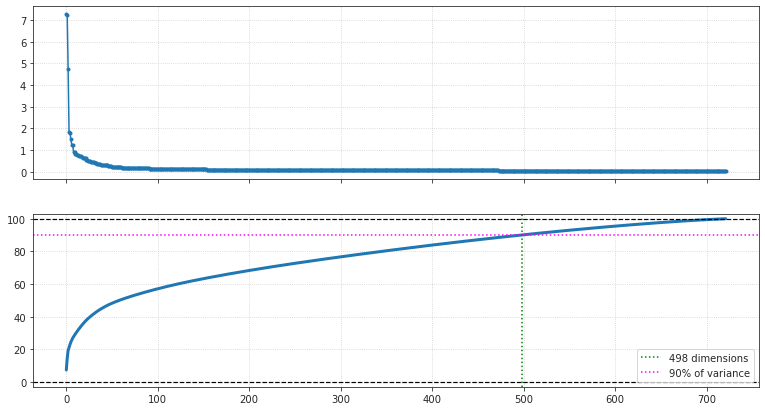

In [35]:
_plot_singular_values(s)

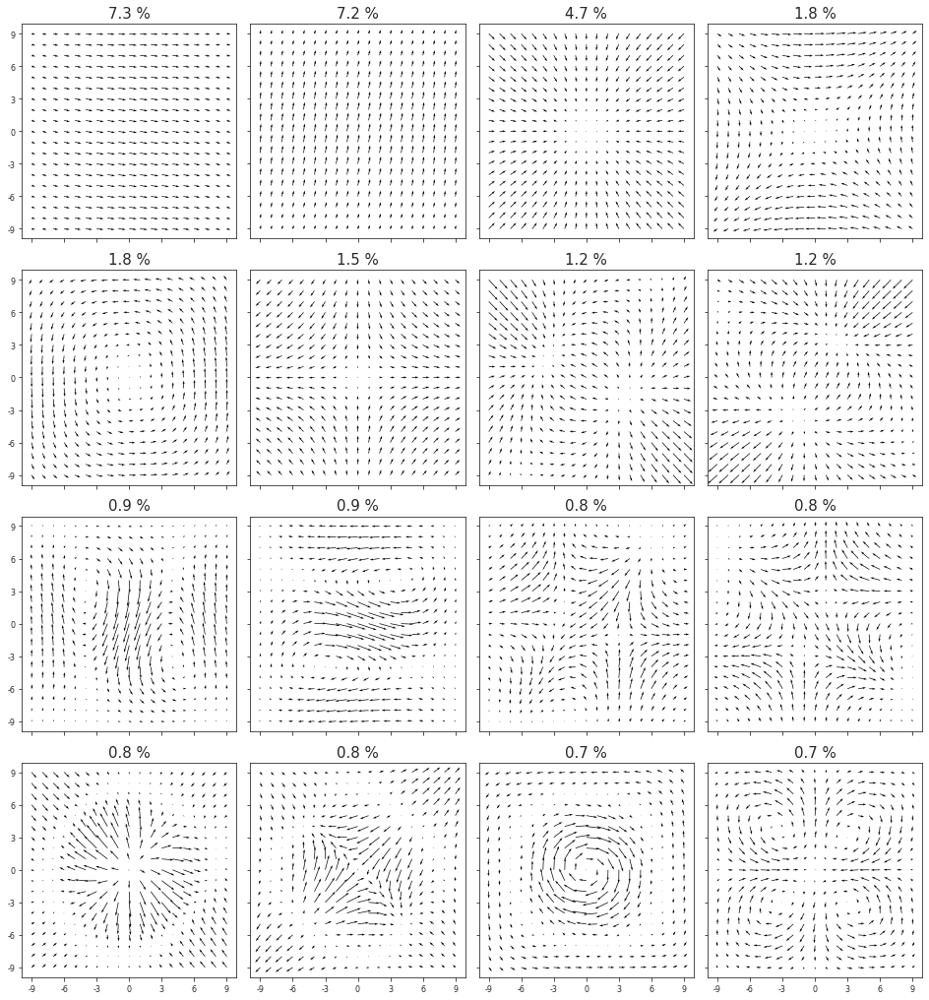

In [36]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

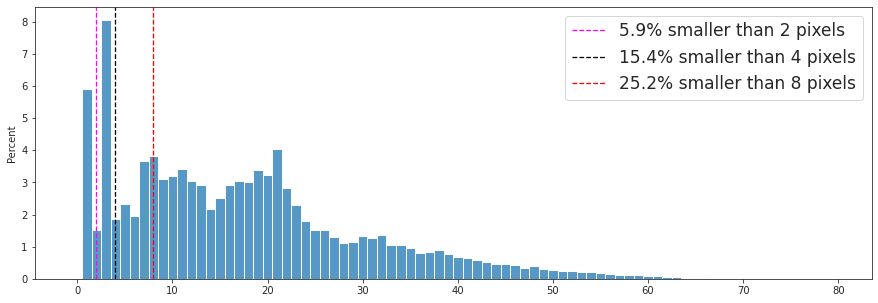

In [37]:
_sizes_hist(of)

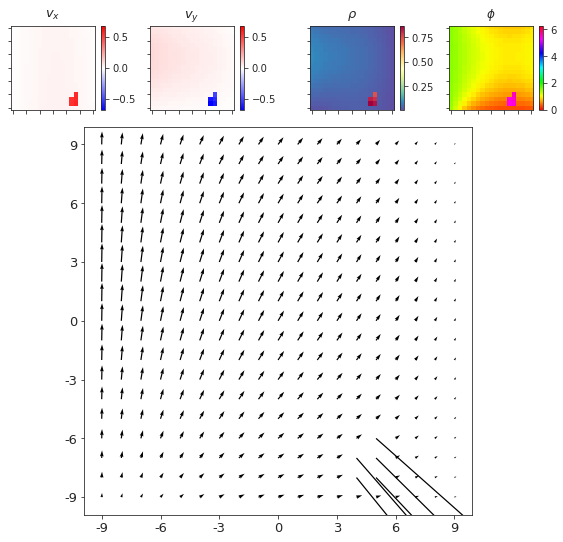

In [38]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

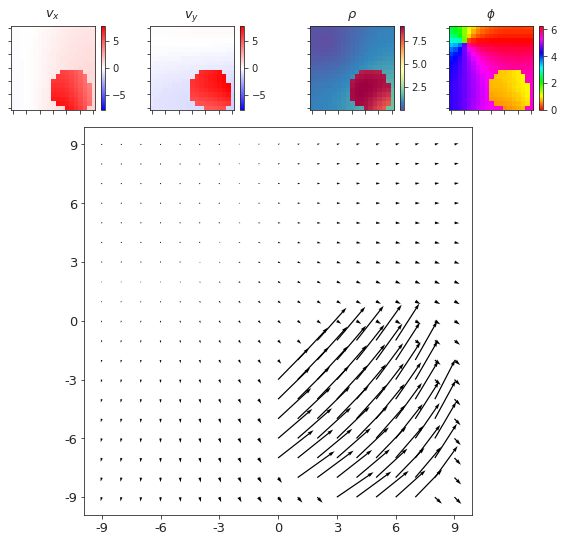

In [39]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

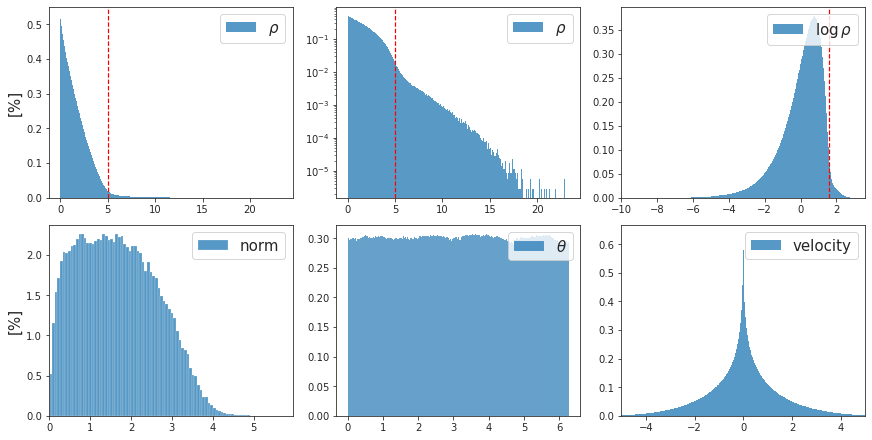

CPU times: user 2min 23s, sys: 22.6 s, total: 2min 46s
Wall time: 2min 46s


In [40]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

## 3. ```fixate```
**Meaning:** Self-motion while maintaining fixation on a point on the wall. This means eyes rotate.

### num objects = 0

In [41]:
%%time

of = OpticFlow(
    category='fixate',
    n=int(1e5),
    n_obj=0,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 1min 52s, sys: 10.8 s, total: 2min 3s
Wall time: 51.8 s


In [42]:
np.abs(np.round(of.alpha_dot[:, of.dim//2, of.dim//2], 7)).sum()

0.0

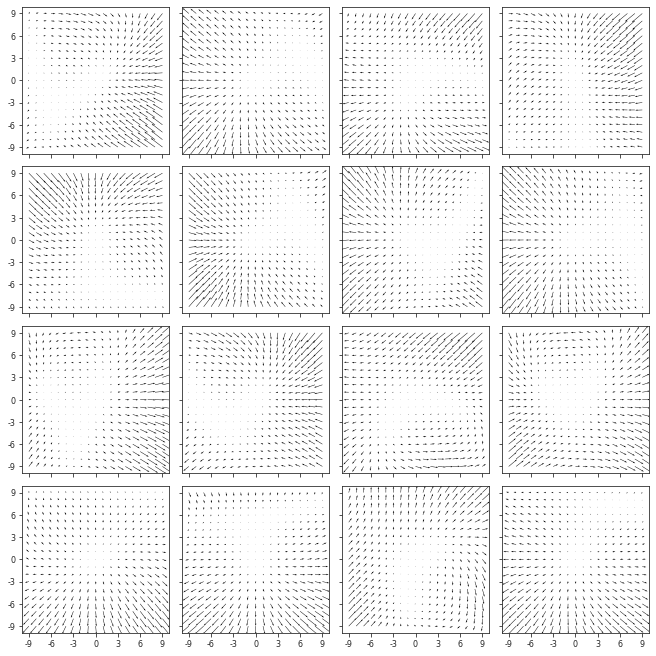

In [43]:
_ = show_opticflow(of.alpha_dot)

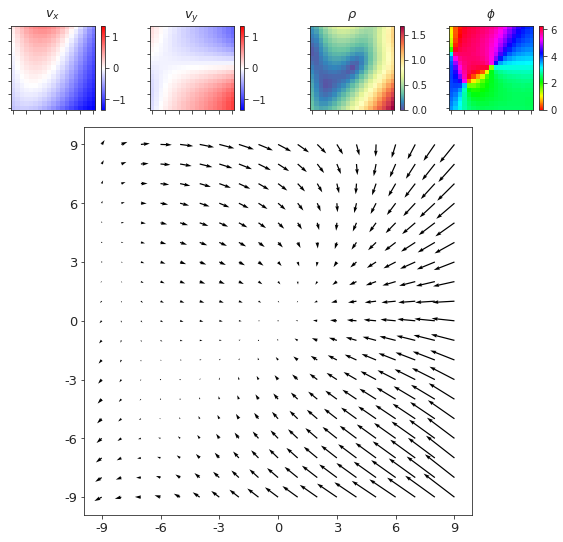

In [44]:
_ = show_opticflow_full(of.alpha_dot[0])

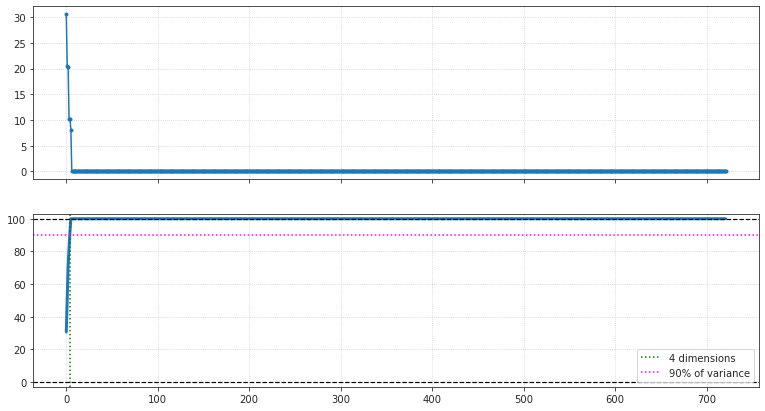

In [45]:
_plot_singular_values(s)

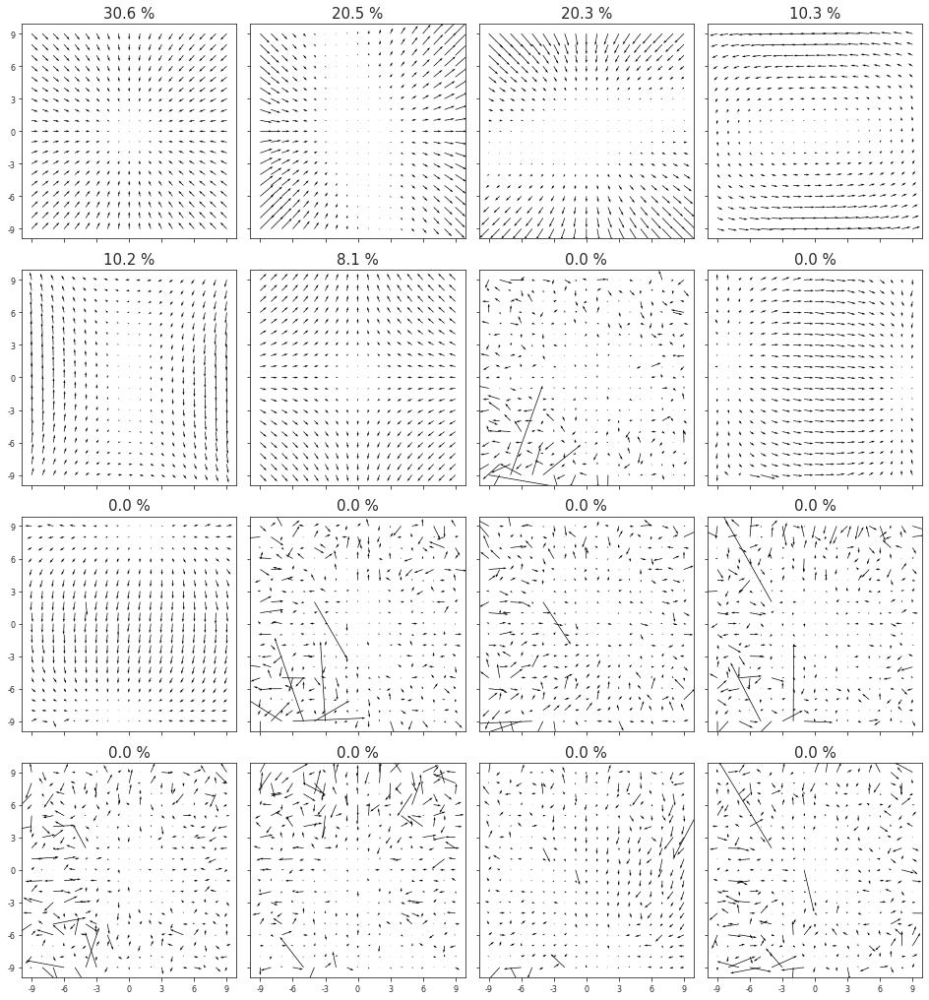

In [46]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

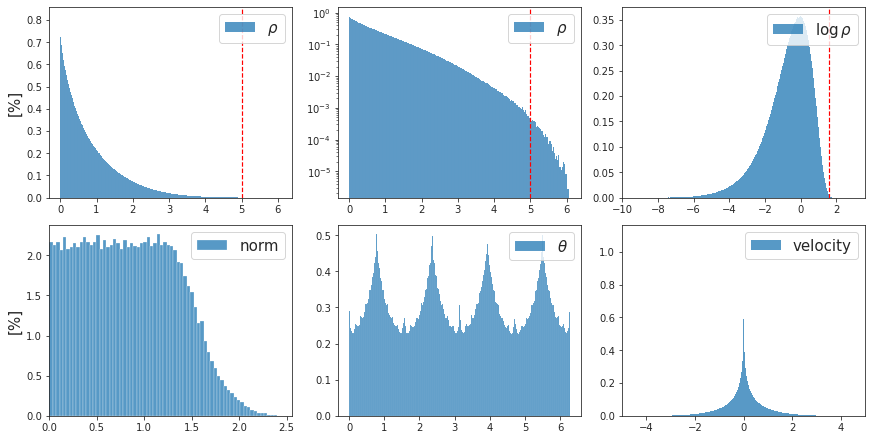

CPU times: user 2min 20s, sys: 22.9 s, total: 2min 43s
Wall time: 2min 43s


In [47]:
%%time

_ = plot_opticflow_hist(of.alpha_dot)

### num objects = 1

In [48]:
%%time

of = OpticFlow(
    category='fixate',
    n=int(1.21e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 3min 17s, sys: 16.8 s, total: 3min 34s
Wall time: 2min 9s


In [49]:
accept.sum()

100051

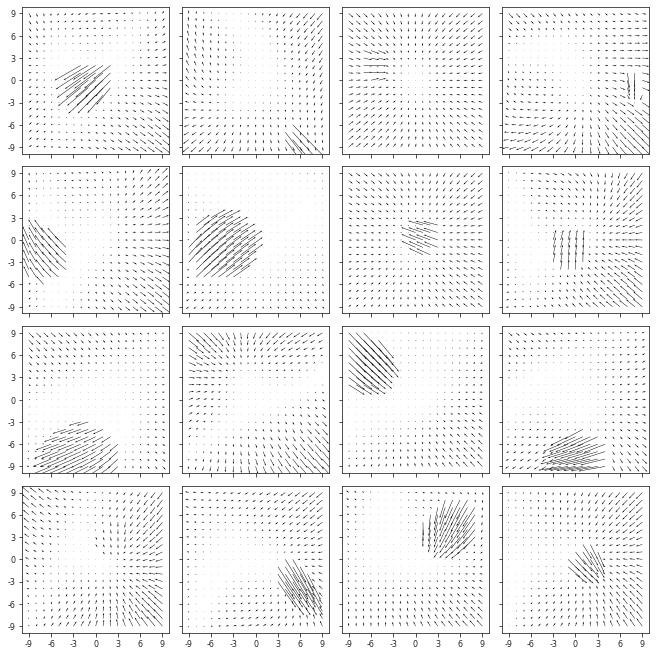

In [50]:
_ = show_opticflow(of.alpha_dot[accept])

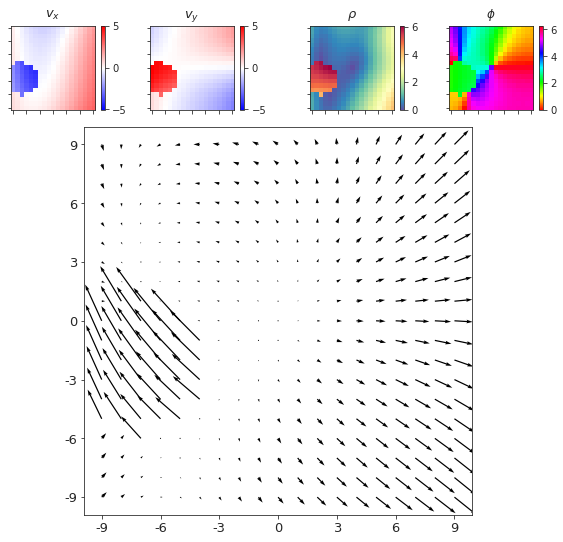

In [51]:
_ = show_opticflow_full(of.alpha_dot[accept][4])

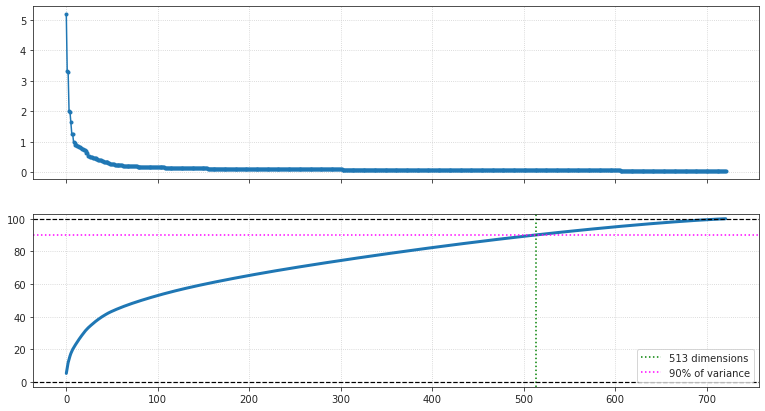

In [52]:
_plot_singular_values(s)

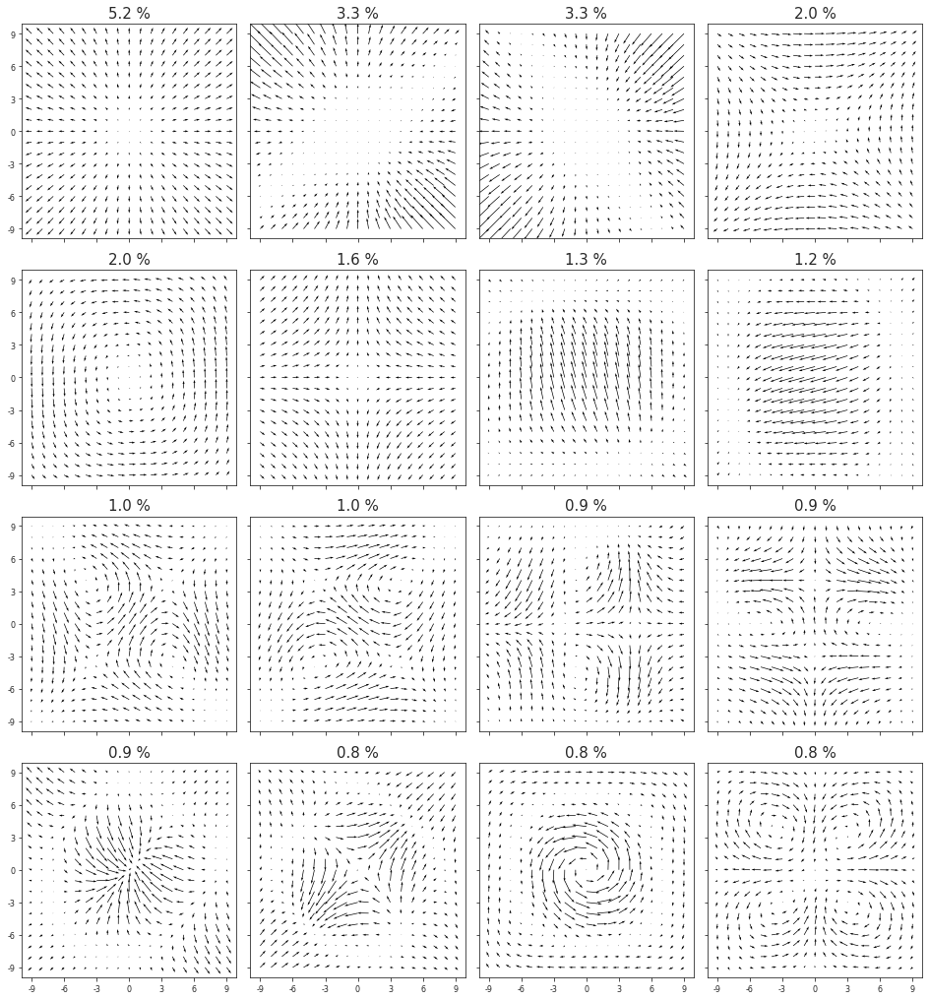

In [53]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

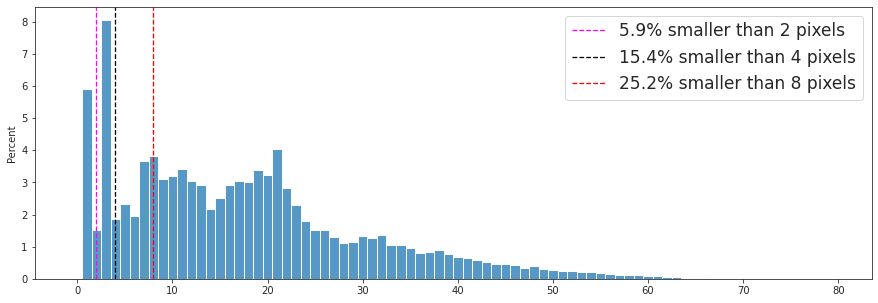

In [54]:
_sizes_hist(of)

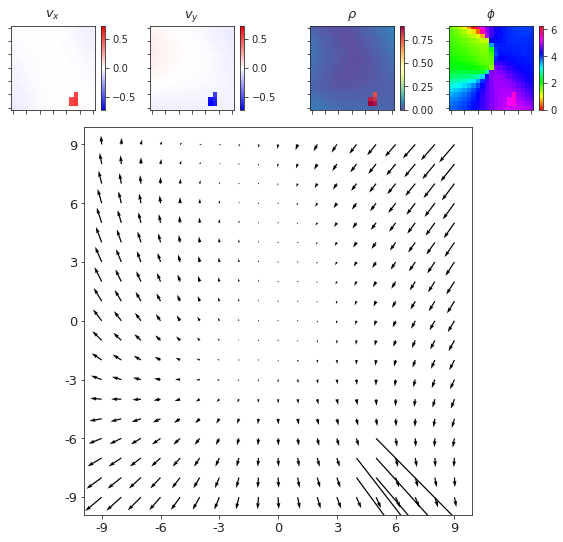

In [55]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

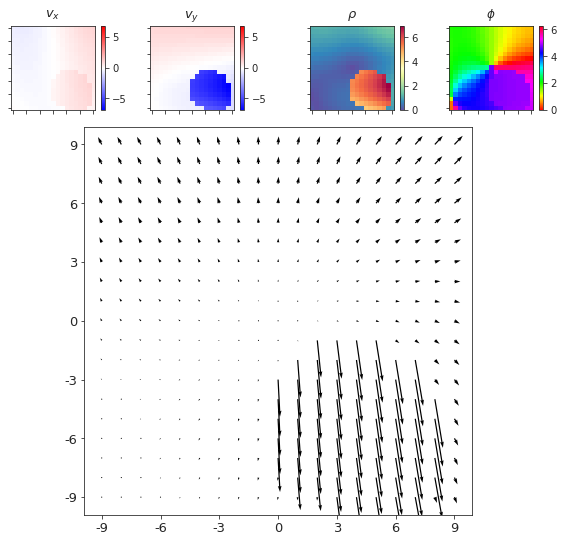

In [56]:
i = np.argsort(size_pix[accept])[-3]
_ = show_opticflow_full(of.alpha_dot[accept][i])

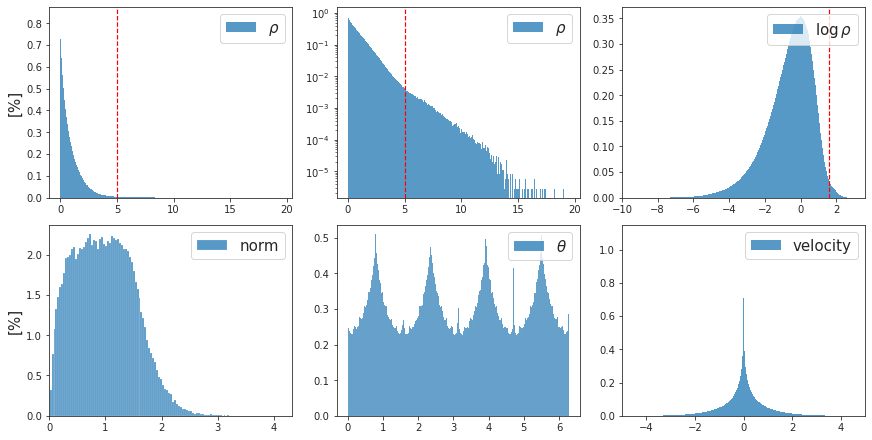

CPU times: user 2min 39s, sys: 22.9 s, total: 3min 2s
Wall time: 3min 2s


In [57]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

### num objects = 4

In [58]:
%%time

of = OpticFlow(
    category='fixate',
    n=int(2e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 6min 43s, sys: 24.4 s, total: 7min 7s
Wall time: 5min 46s


In [59]:
accept.sum()

101864

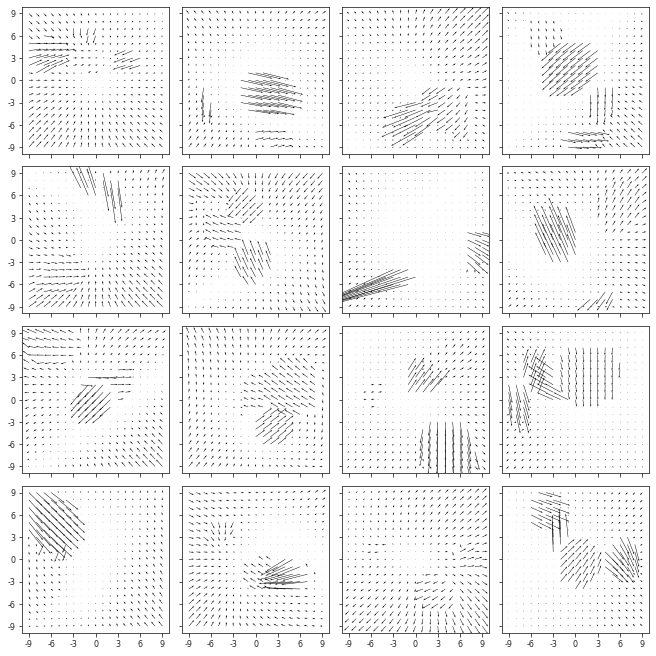

In [60]:
_ = show_opticflow(of.alpha_dot[accept])

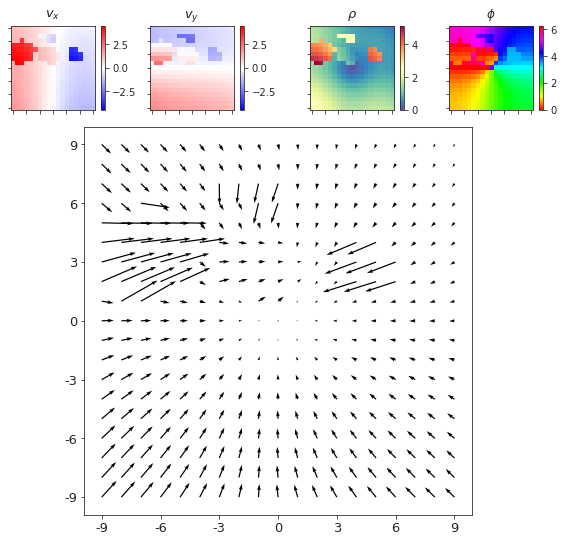

In [61]:
_ = show_opticflow_full(of.alpha_dot[accept][0])

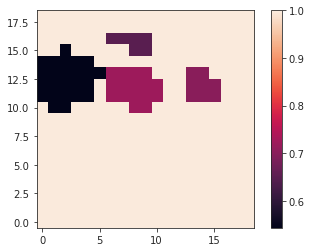

In [62]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][0])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

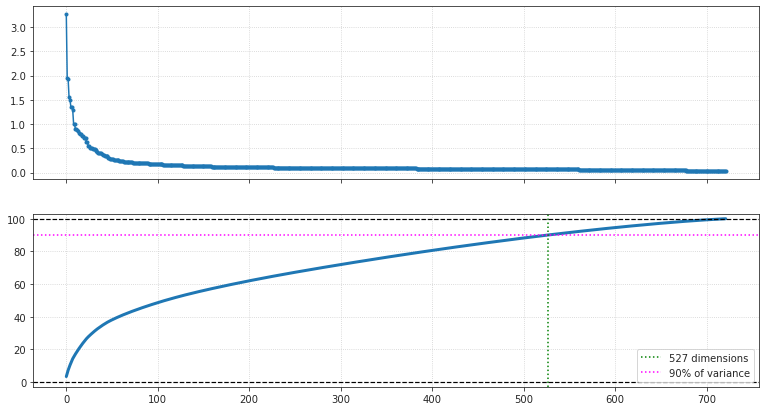

In [63]:
_plot_singular_values(s)

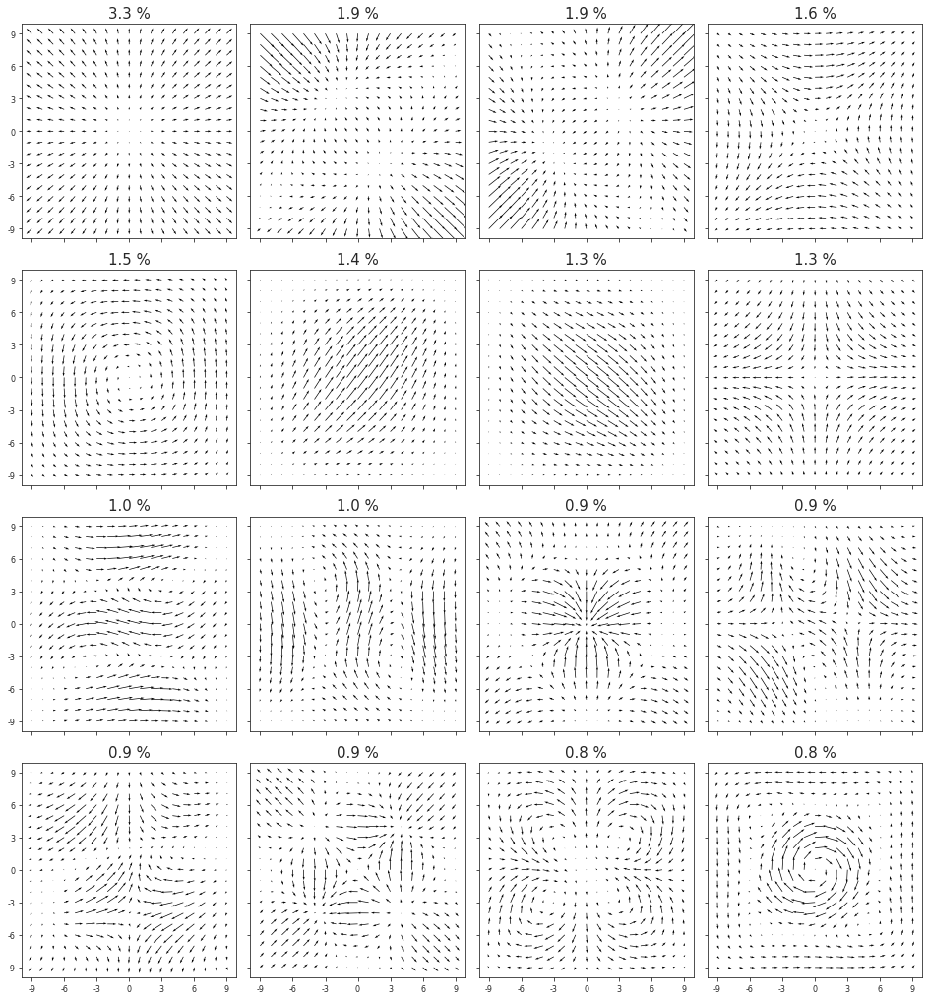

In [64]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

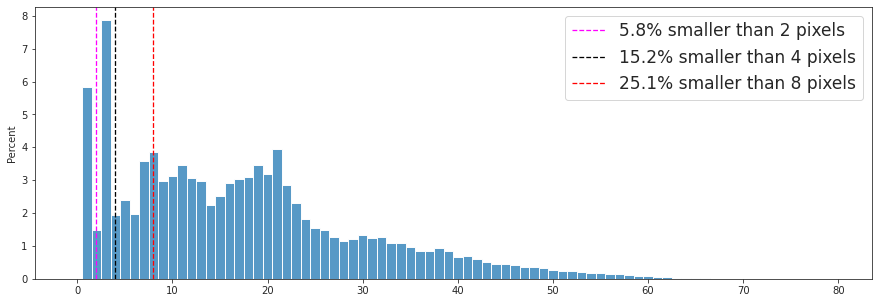

In [65]:
_sizes_hist(of)

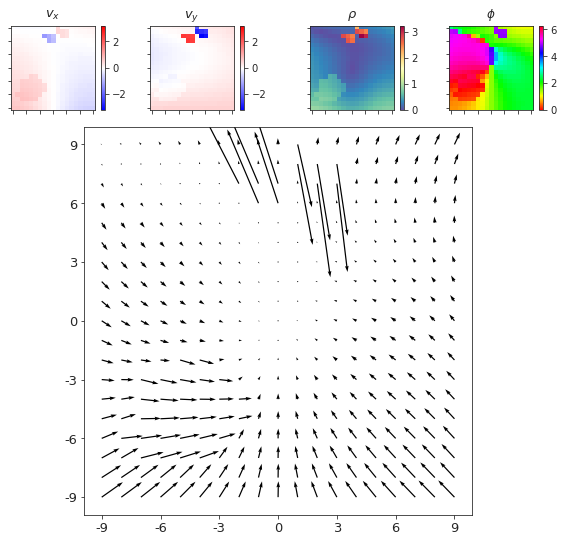

In [66]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

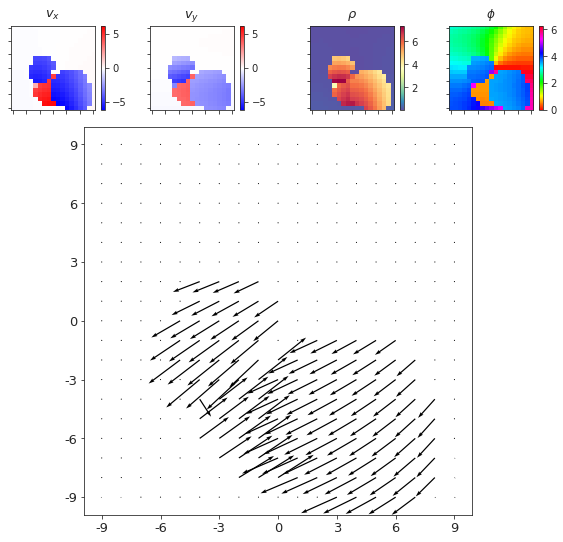

In [67]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

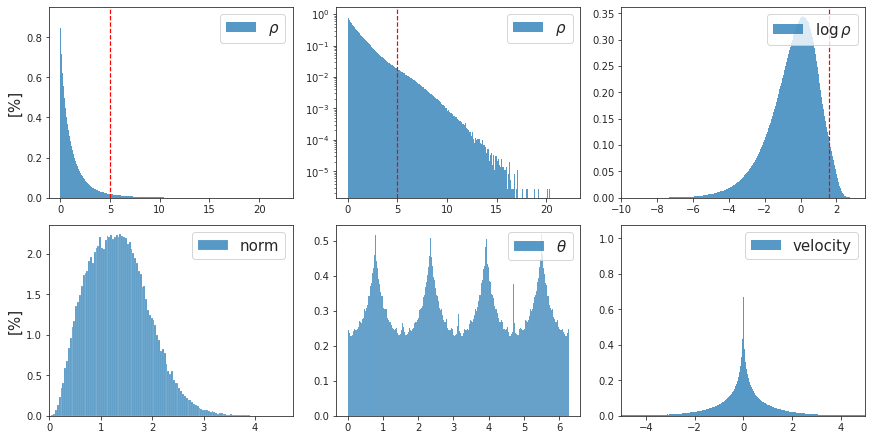

CPU times: user 2min 32s, sys: 22.9 s, total: 2min 54s
Wall time: 2min 54s


In [68]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

### num objects = 8

In [69]:
%%time

of = OpticFlow(
    category='fixate',
    n=int(5e5),
    n_obj=8,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 22min 8s, sys: 1min 19s, total: 23min 27s
Wall time: 20min 52s


In [70]:
accept.sum()

157421

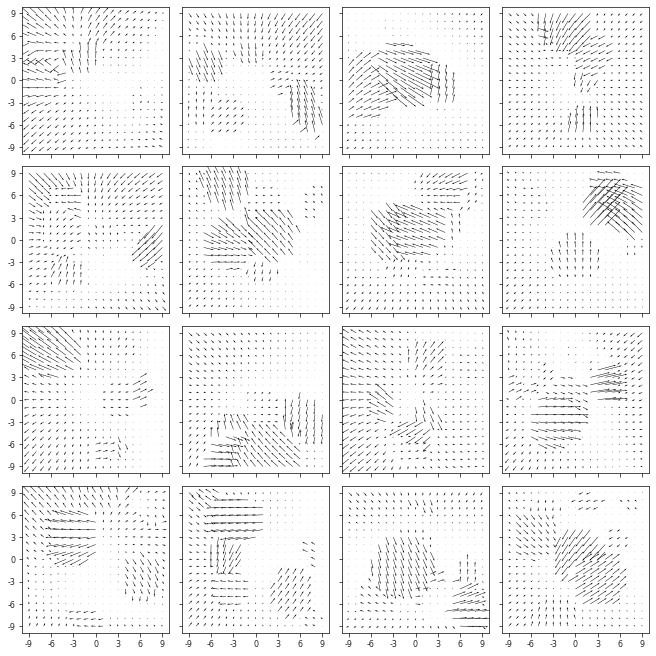

In [71]:
_ = show_opticflow(of.alpha_dot[accept])

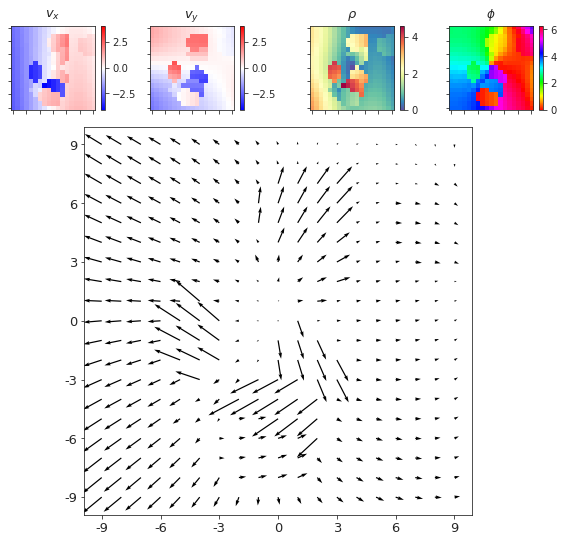

In [72]:
_ = show_opticflow_full(of.alpha_dot[accept][10])

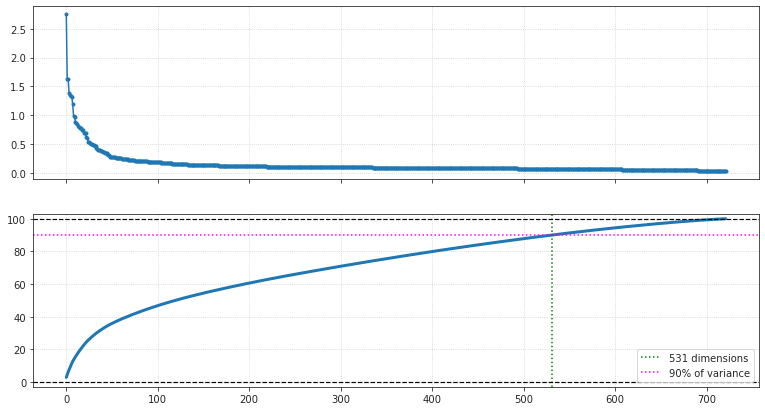

In [73]:
_plot_singular_values(s)

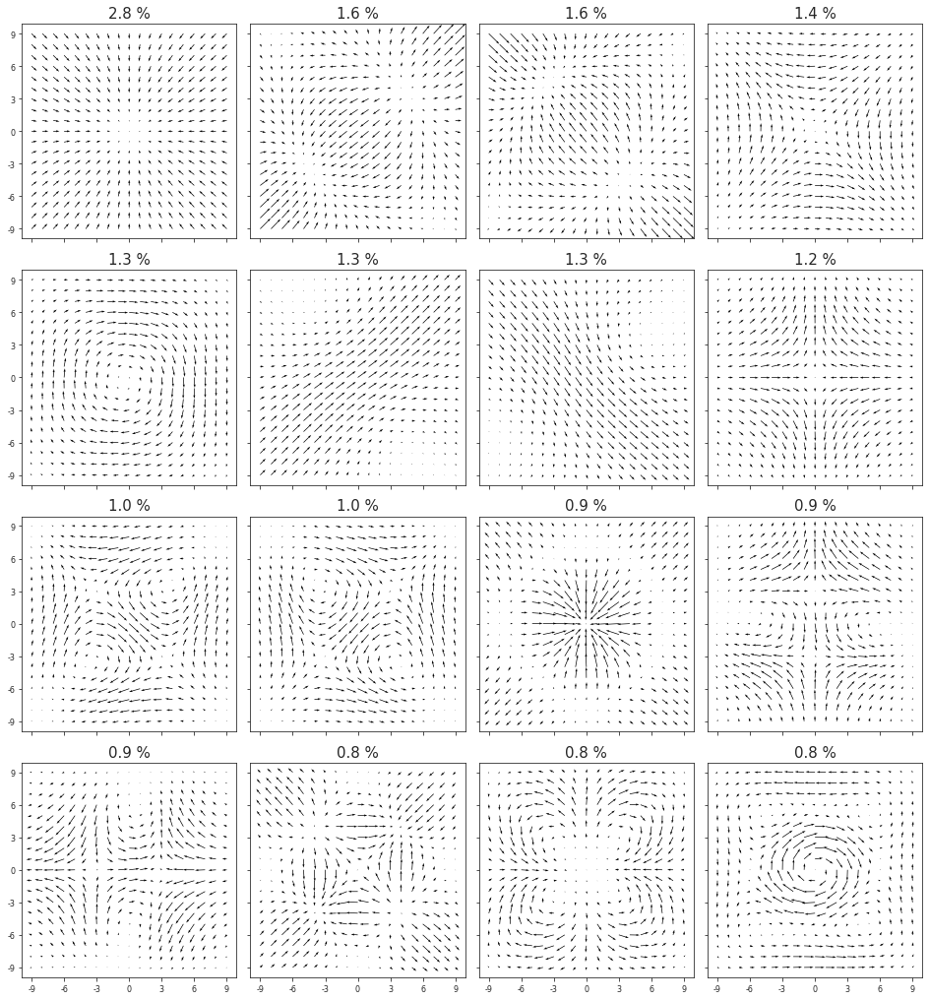

In [74]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

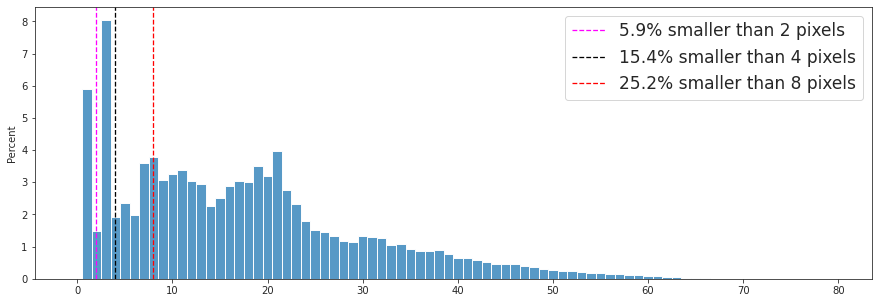

In [75]:
_sizes_hist(of)

In [76]:
size_pix = of.objects[0].size * of.dim ** 2

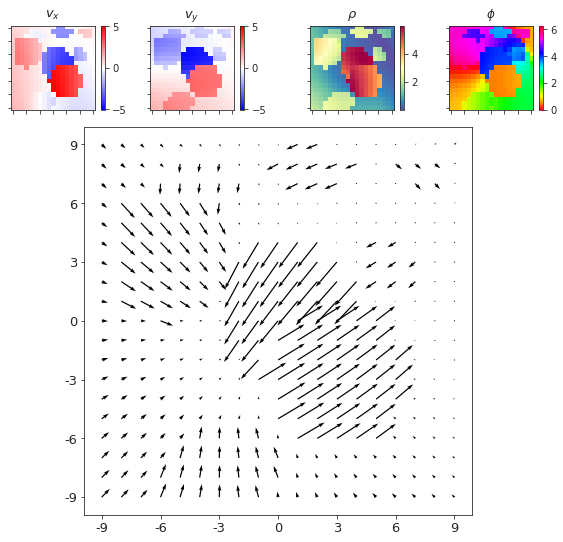

In [77]:
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

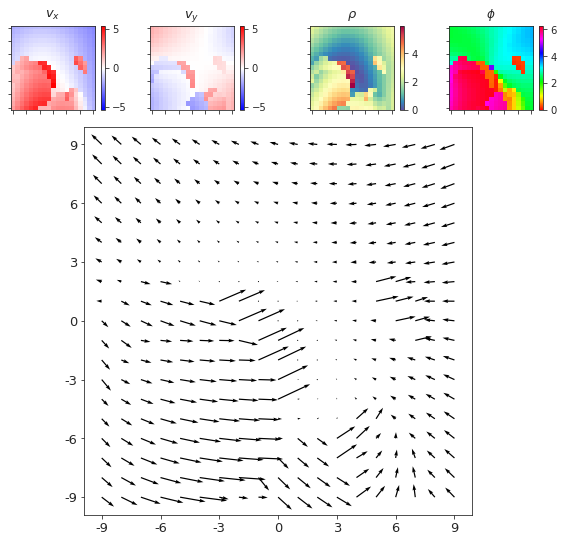

In [78]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

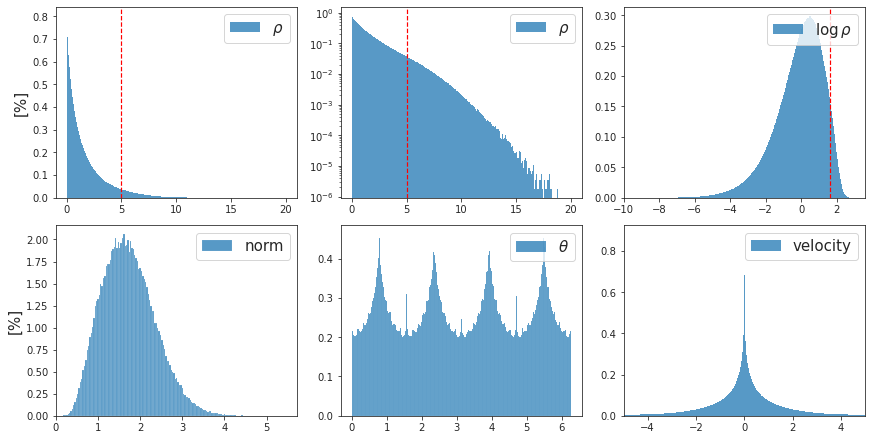

CPU times: user 3min 34s, sys: 31.7 s, total: 4min 6s
Wall time: 4min 6s


In [79]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

## 4. ```pursuit```
**Meaning:** Self-motion while maintaining fixation on a moving object. Eyes rotate to compensate for the net motion of the object + self.

### num objects = 1

In [80]:
%%time

of = OpticFlow(
    category='pursuit',
    n=int(1e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 2min 58s, sys: 13.6 s, total: 3min 12s
Wall time: 1min 41s


In [81]:
accept.sum()

100000

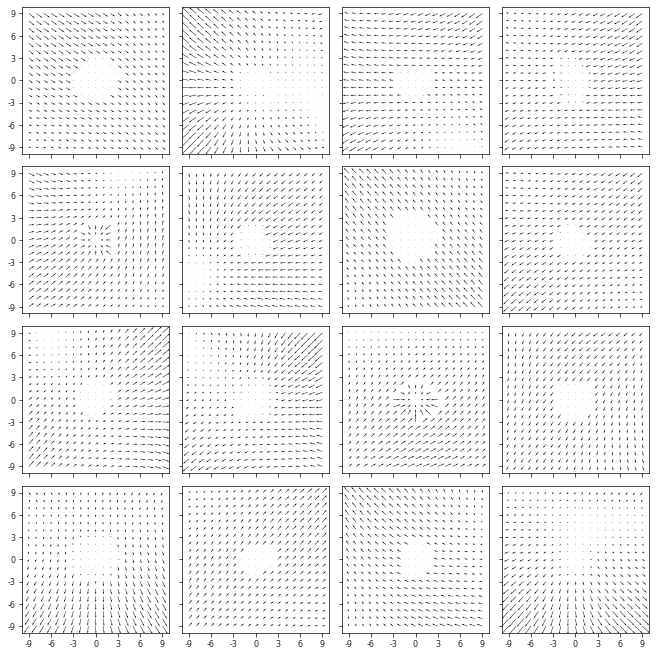

In [82]:
_ = show_opticflow(of.alpha_dot[accept])

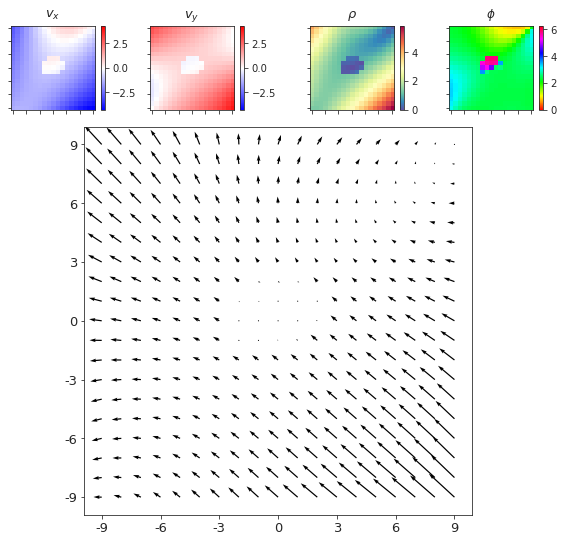

In [83]:
_ = show_opticflow_full(of.alpha_dot[accept][209])

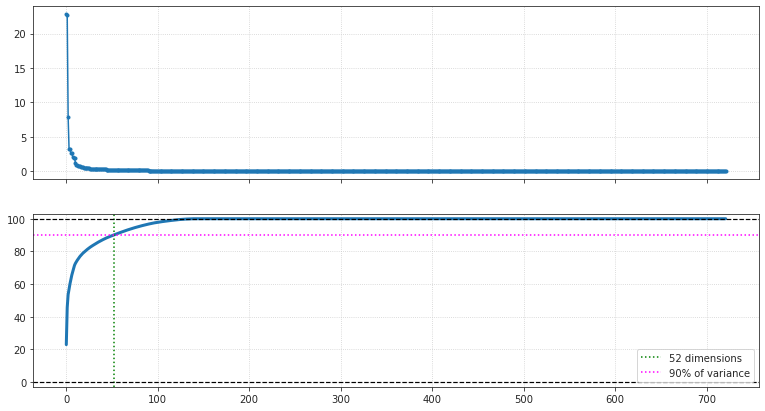

In [84]:
_plot_singular_values(s)

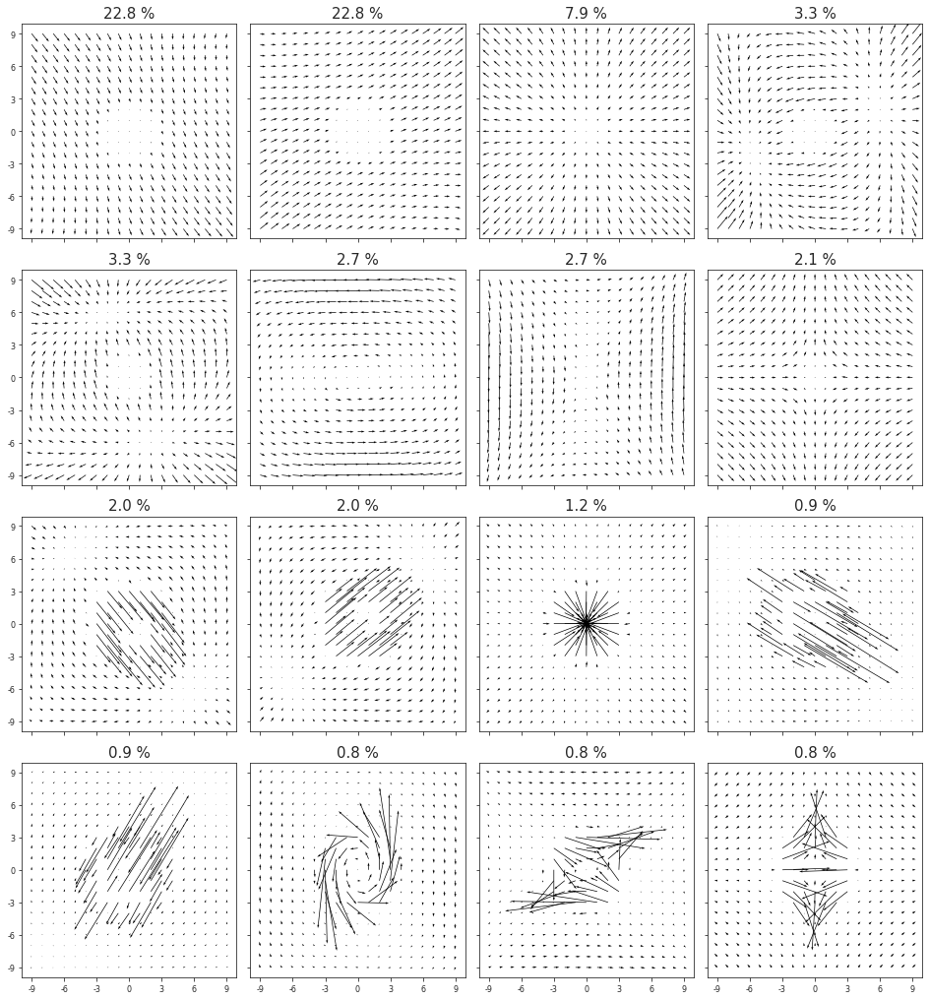

In [85]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

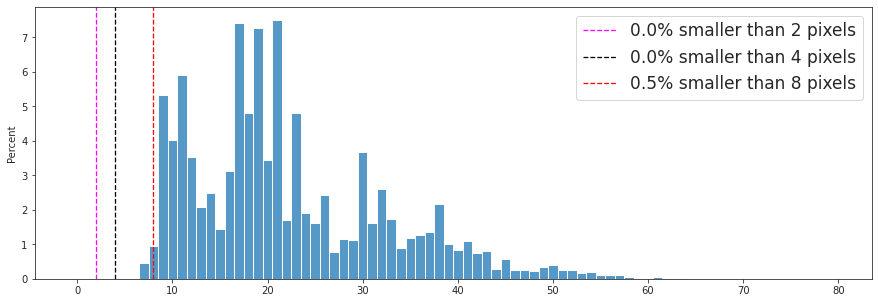

In [86]:
_sizes_hist(of)

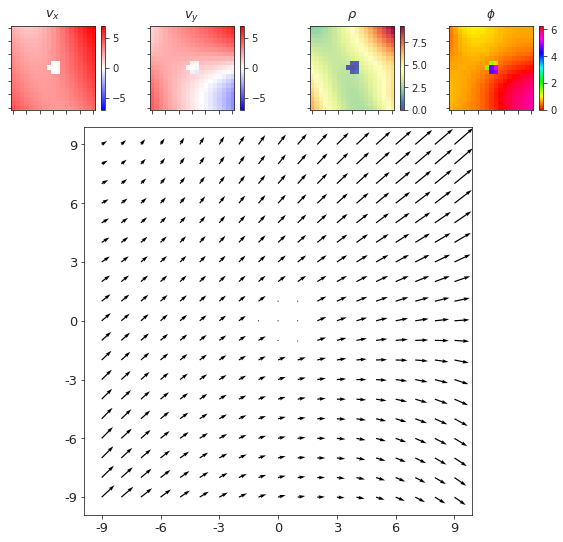

In [87]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

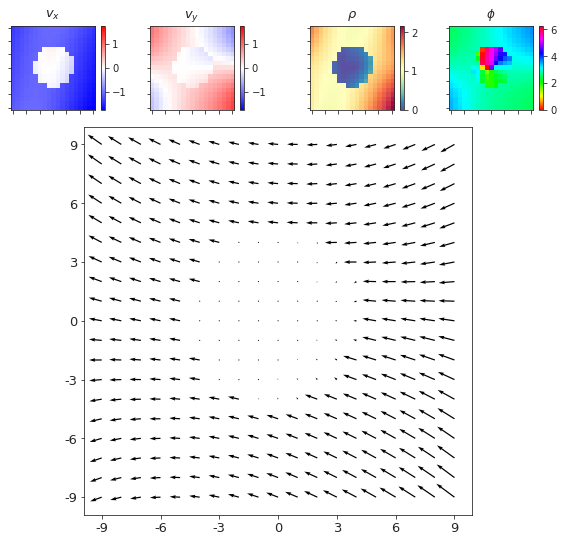

In [88]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

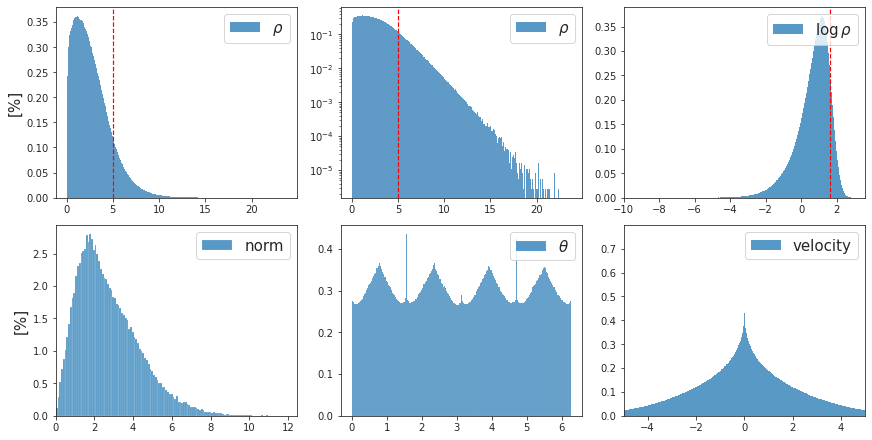

CPU times: user 2min 15s, sys: 18.7 s, total: 2min 33s
Wall time: 2min 33s


In [89]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

### num objects = 2

In [90]:
%%time

of = OpticFlow(
    category='pursuit',
    n=int(1.2e5),
    n_obj=2,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 3min 43s, sys: 15.4 s, total: 3min 58s
Wall time: 2min 26s


In [91]:
accept.sum()

99286

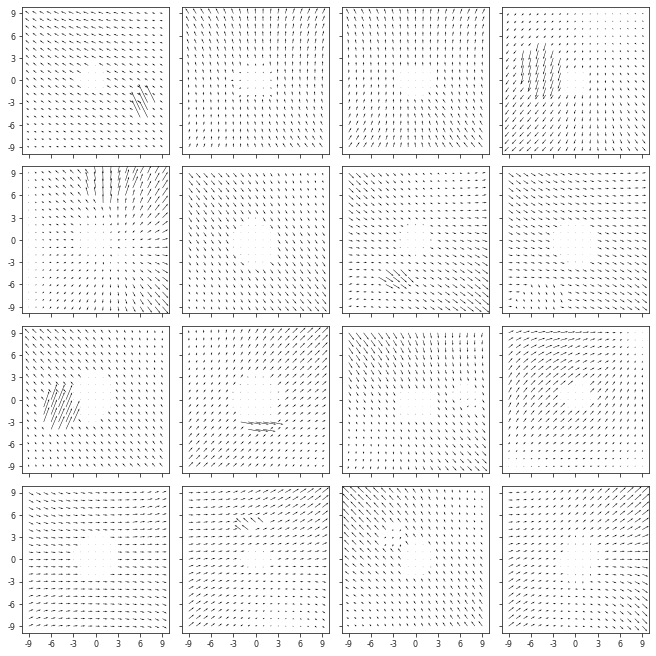

In [92]:
_ = show_opticflow(of.alpha_dot[accept])

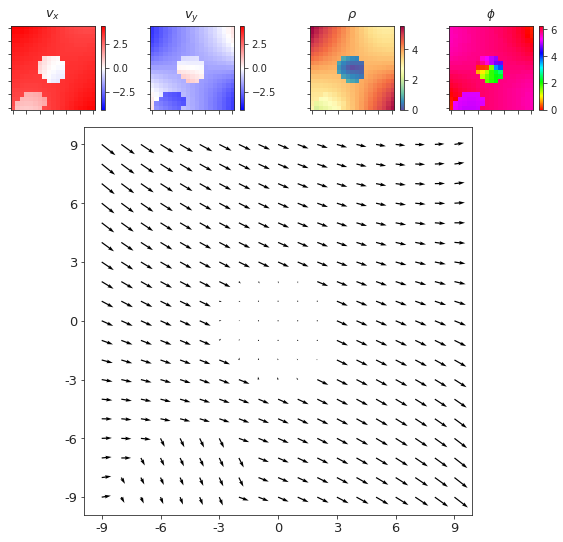

In [93]:
_ = show_opticflow_full(of.alpha_dot[accept][7])

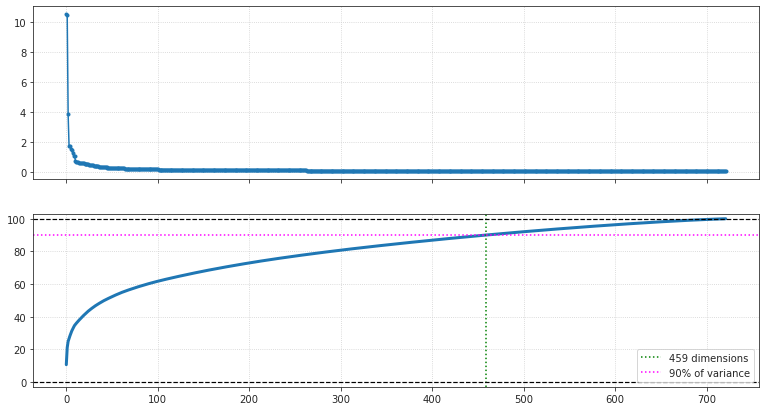

In [94]:
_plot_singular_values(s)

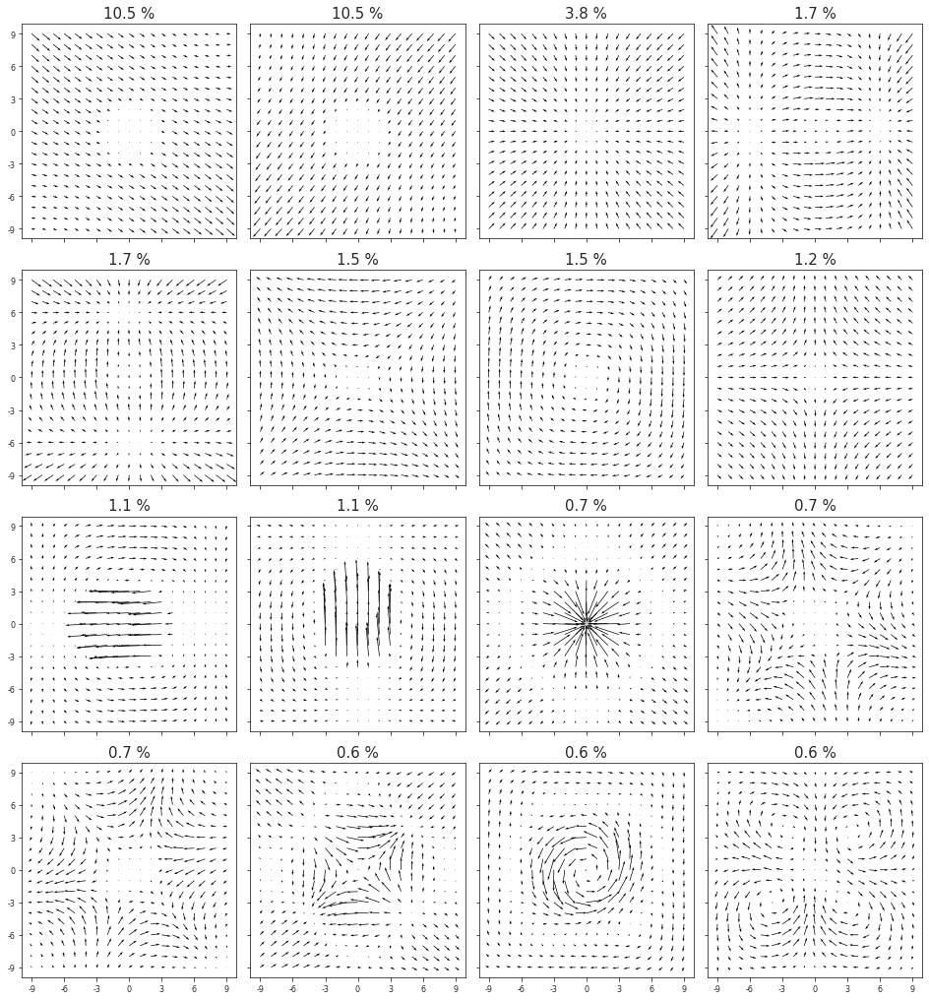

In [95]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

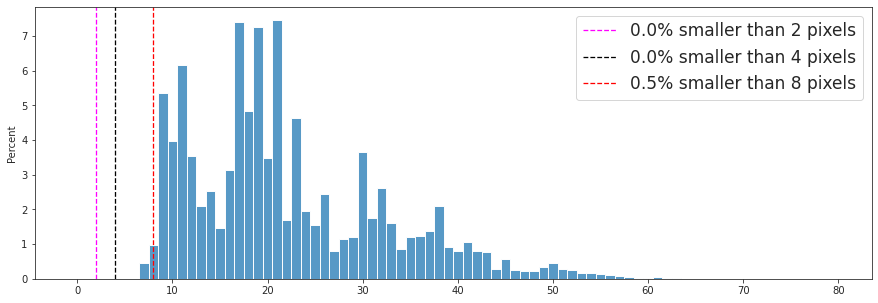

In [96]:
_sizes_hist(of)

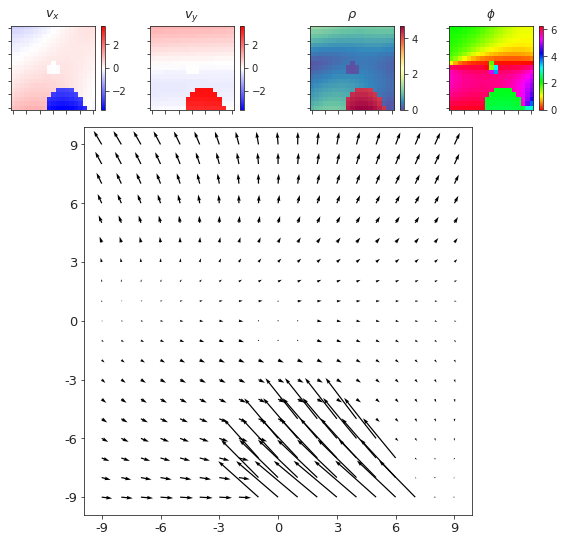

In [97]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

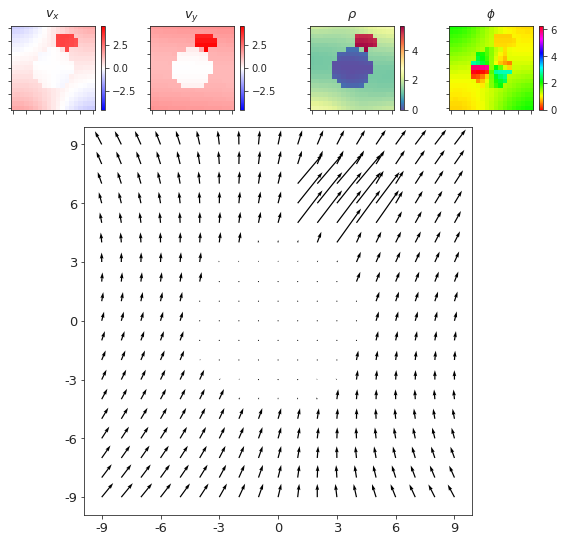

In [98]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

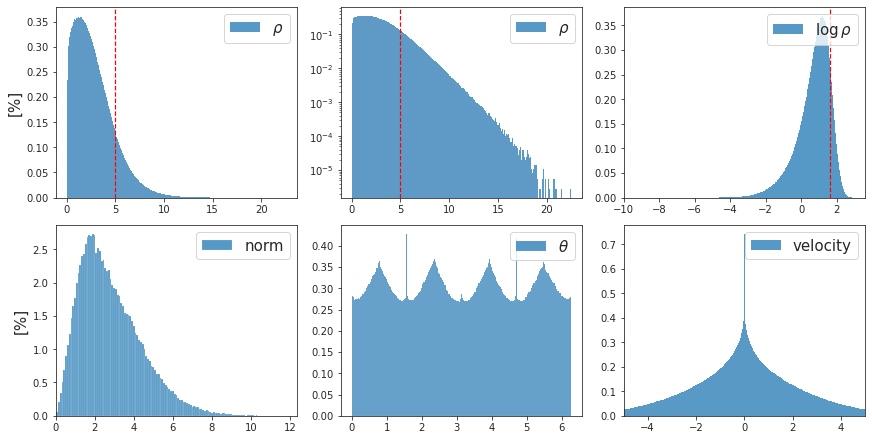

CPU times: user 2min 13s, sys: 18.5 s, total: 2min 32s
Wall time: 2min 32s


In [99]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

## 5. ```Terrain```
**Meaning:** Similar to ```fixate```, there is self-motion while maintaining fixation on a background. Eyes rotate to compensate for the net motion of the self. There are many stationary objects. This approximately corresponds to walking in a rough terrain.

### num objects = 4
additional params: max $\phi$ = 80, fix lower bound = 0.75

In [100]:
%%time

kws['terrain_phi'] = 80
kws['terrain_fix'] = 0.75

of = OpticFlow(
    category='terrain',
    n=int(3.3e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 9min 56s, sys: 41.4 s, total: 10min 37s
Wall time: 9min 6s


In [101]:
accept.sum()

102753

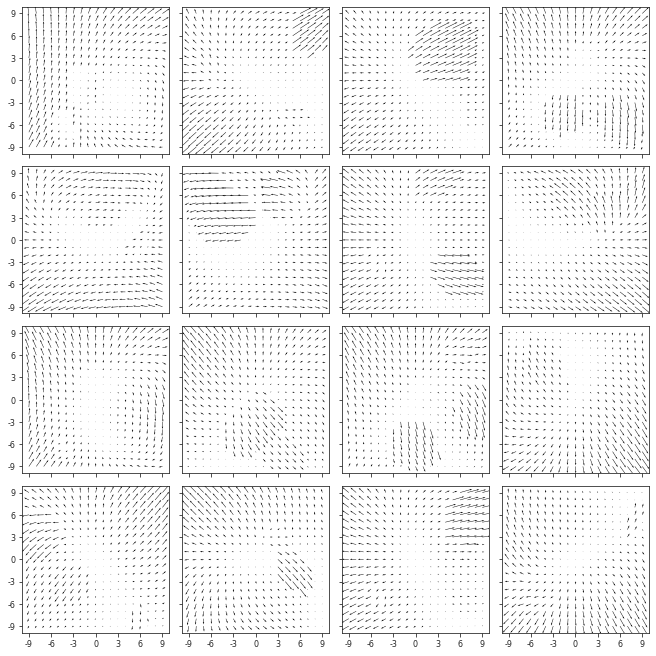

In [102]:
_ = show_opticflow(of.alpha_dot[accept])

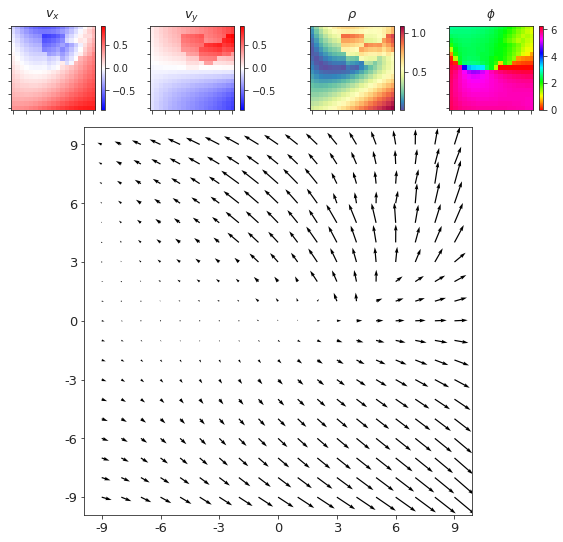

In [103]:
_ = show_opticflow_full(of.alpha_dot[accept][7])

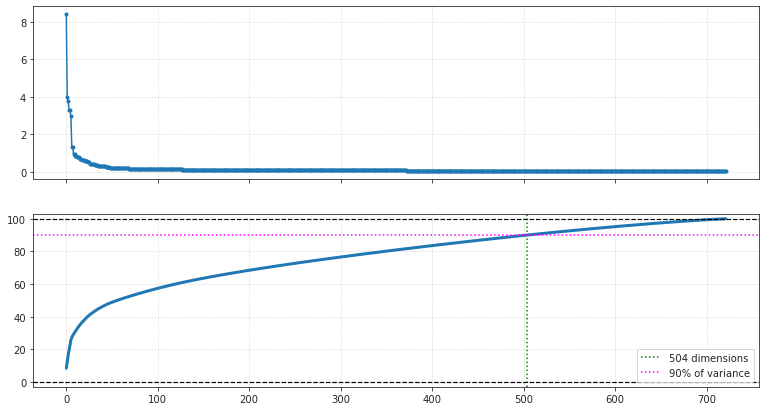

In [104]:
_plot_singular_values(s)

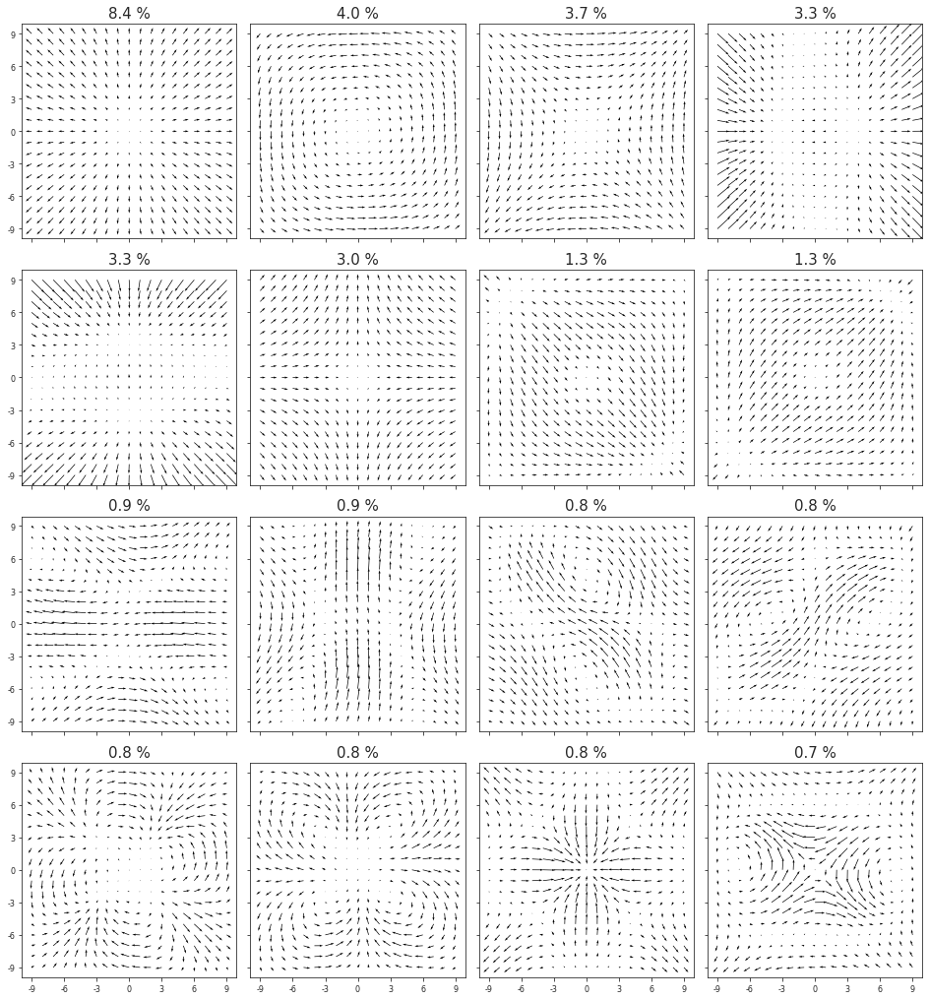

In [105]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

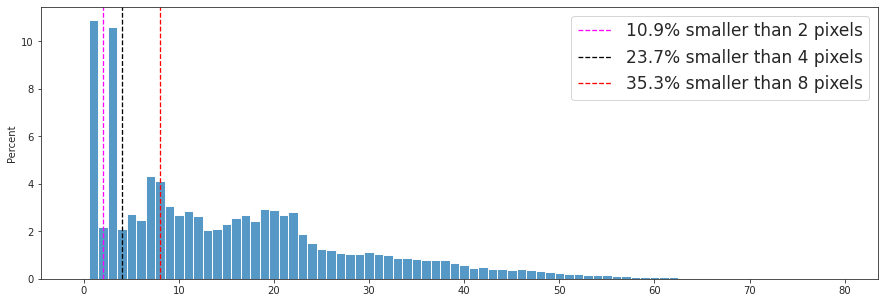

In [106]:
_sizes_hist(of)

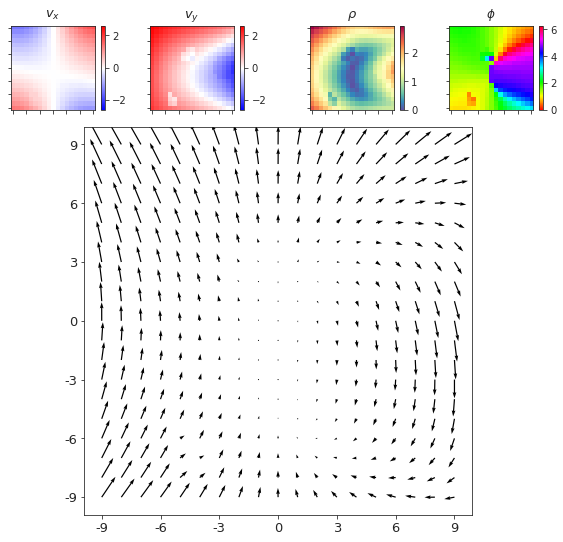

In [107]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

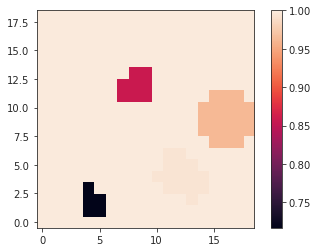

In [108]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][i])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

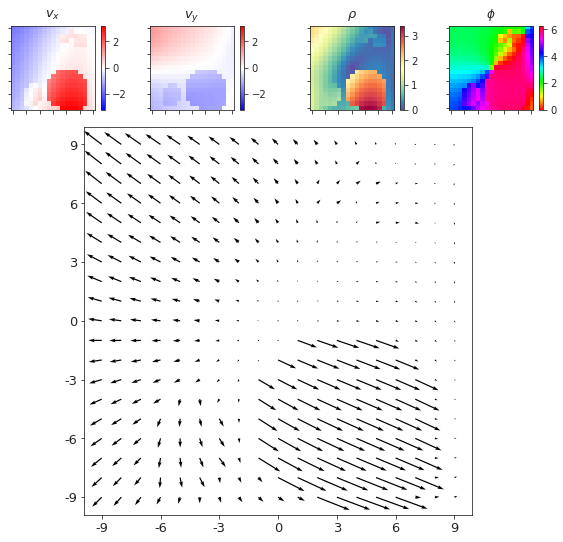

In [109]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

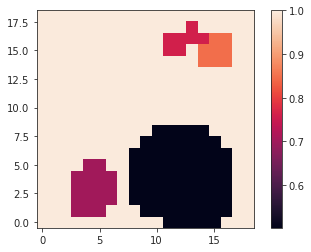

In [110]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][i])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

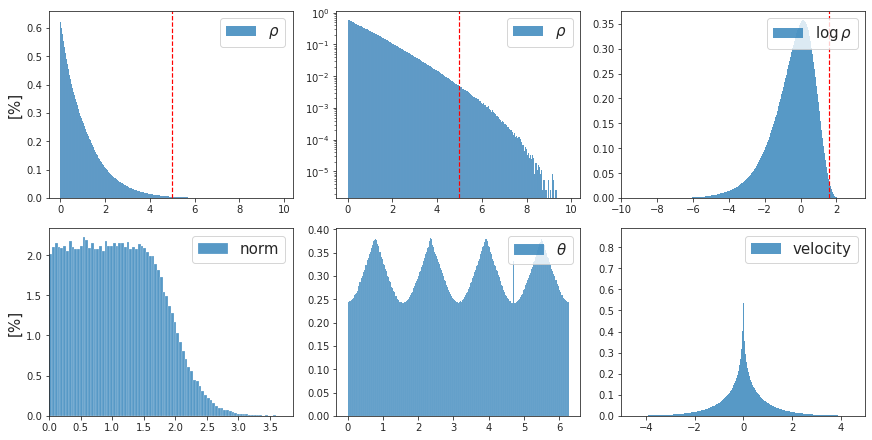

CPU times: user 2min 18s, sys: 19.7 s, total: 2min 38s
Wall time: 2min 38s


In [111]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

### num objects = 4 (+more strict lower bound for fix)
additional params: max $\phi$ = 80, fix lower bound = 0.95

In [112]:
%%time

kws['terrain_phi'] = 80
kws['terrain_fix'] = 0.95

of = OpticFlow(
    category='terrain',
    n=int(3.95e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 11min 49s, sys: 1min, total: 12min 49s
Wall time: 11min 33s


In [113]:
accept.sum()

100198

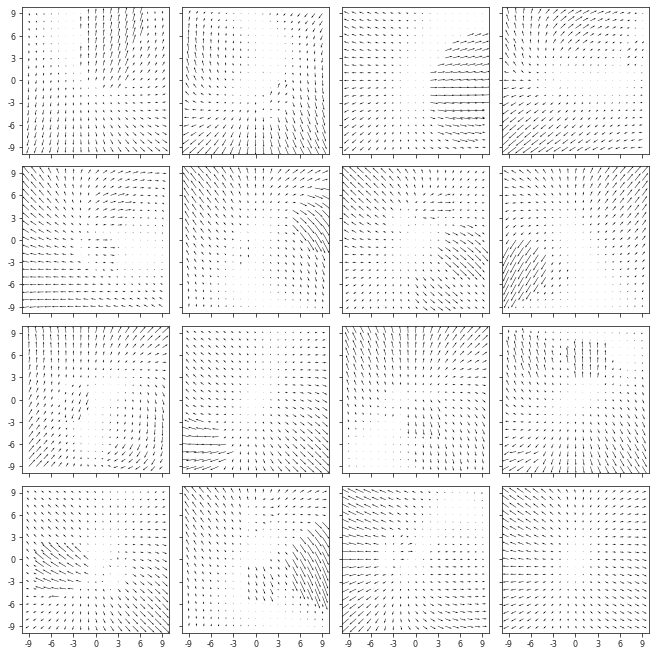

In [114]:
_ = show_opticflow(of.alpha_dot[accept])

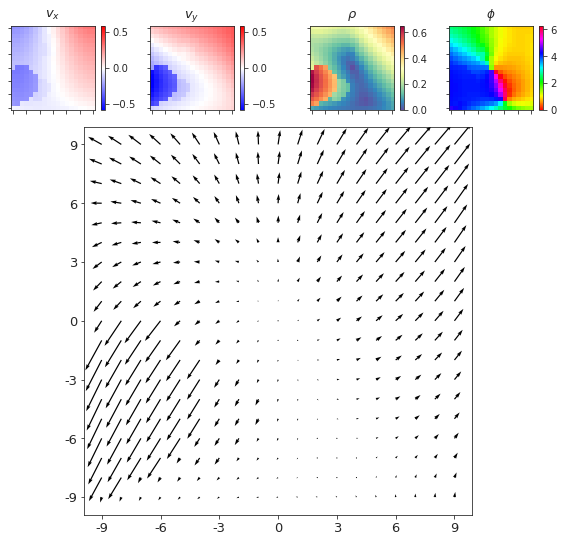

In [115]:
_ = show_opticflow_full(of.alpha_dot[accept][7])

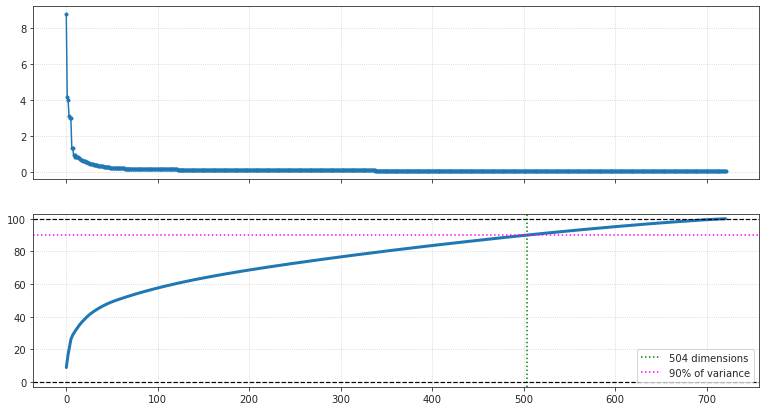

In [116]:
_plot_singular_values(s)

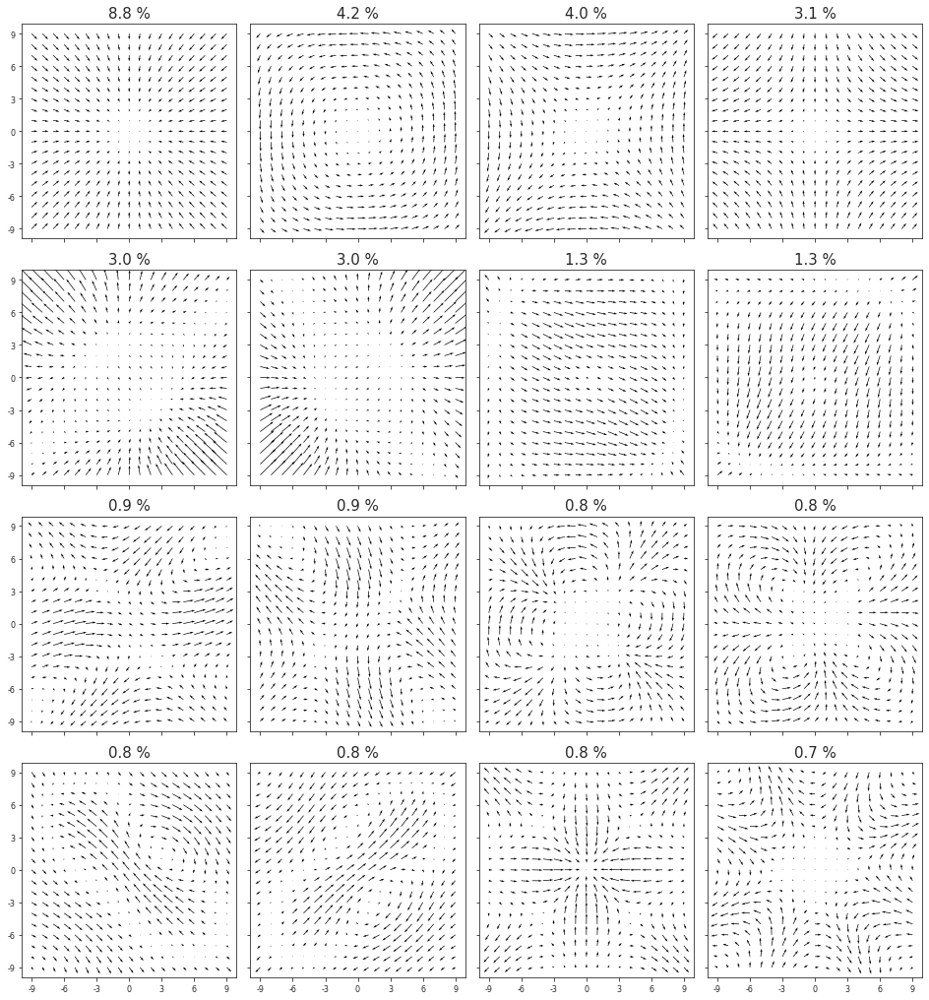

In [117]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

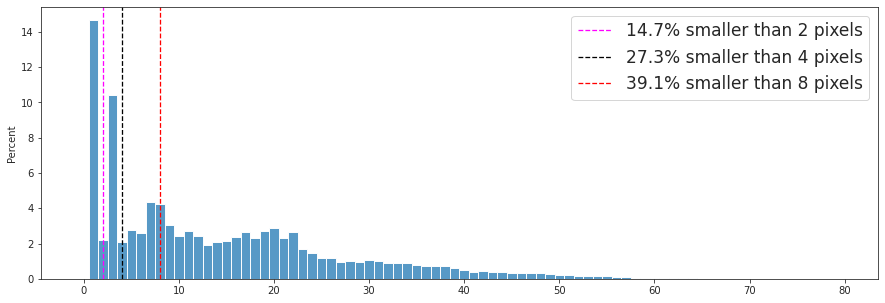

In [118]:
_sizes_hist(of)

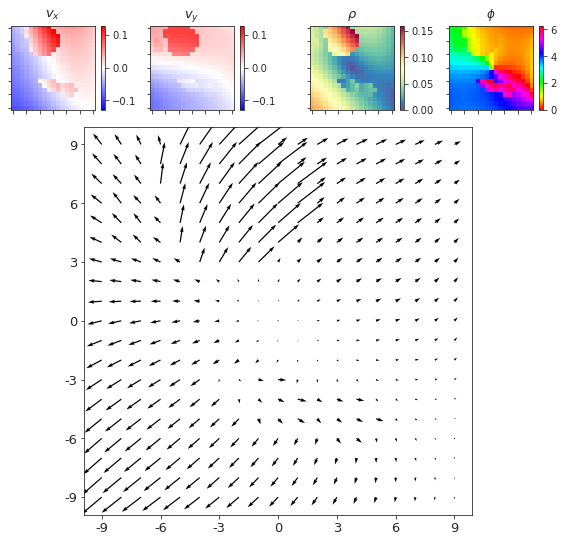

In [119]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

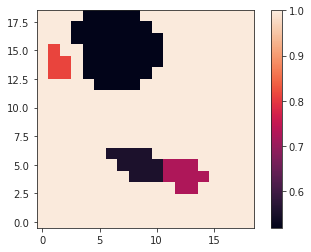

In [120]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][i])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

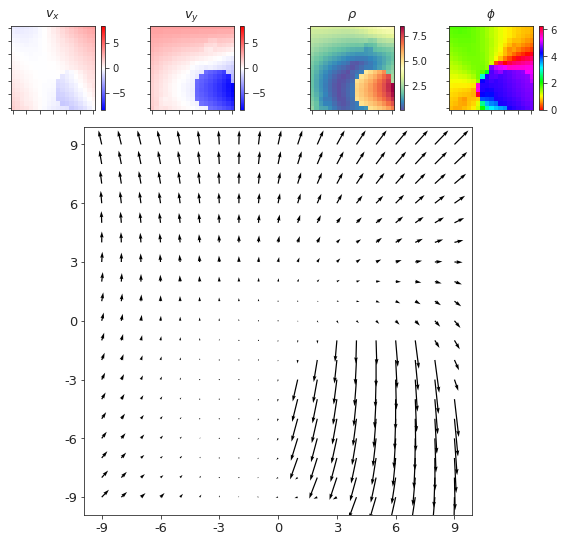

In [121]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

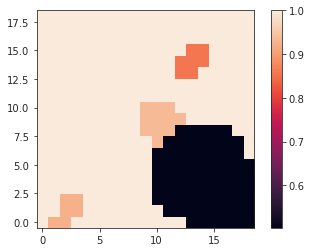

In [122]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][i])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

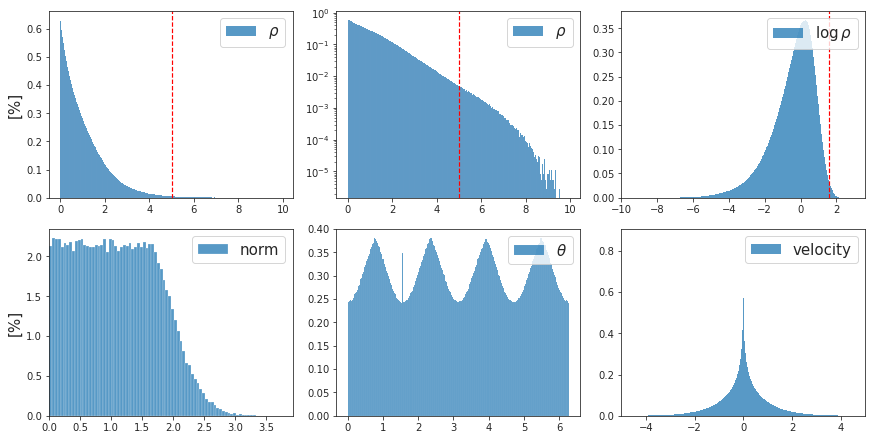

CPU times: user 2min 16s, sys: 19.4 s, total: 2min 36s
Wall time: 2min 36s


In [123]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

### num objects = 8
additional params: max $\phi$ = 80, fix lower bound = 0.75

In [124]:
%%time

kws['terrain_phi'] = 80
kws['terrain_fix'] = 0.75

of = OpticFlow(
    category='terrain',
    n=int(3e5),
    n_obj=8,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(2)# min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 13min 10s, sys: 34.5 s, total: 13min 45s
Wall time: 12min 15s


In [125]:
accept.sum()

101433

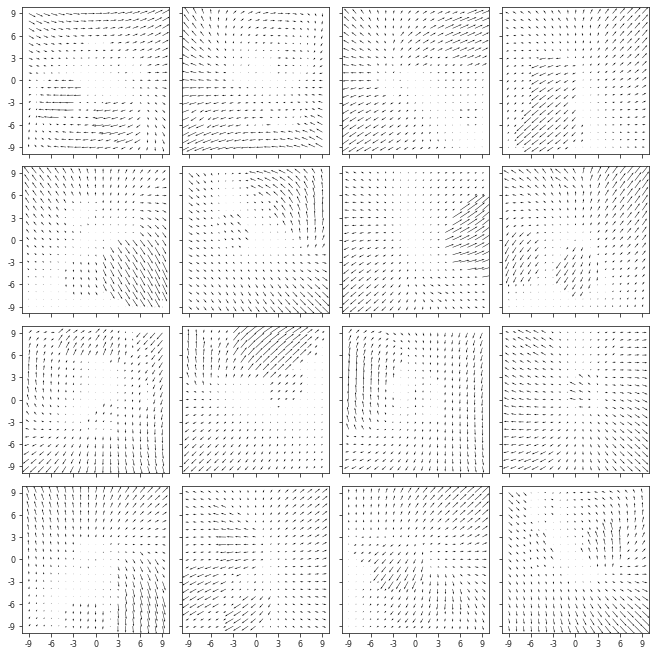

In [126]:
_ = show_opticflow(of.alpha_dot[accept])

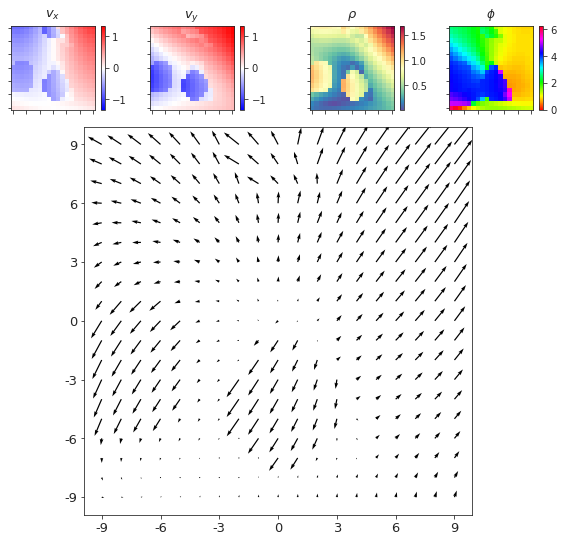

In [127]:
_ = show_opticflow_full(of.alpha_dot[accept][7])

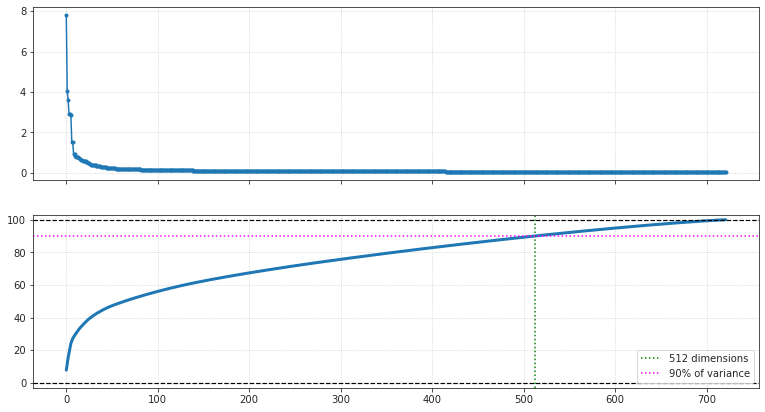

In [128]:
_plot_singular_values(s)

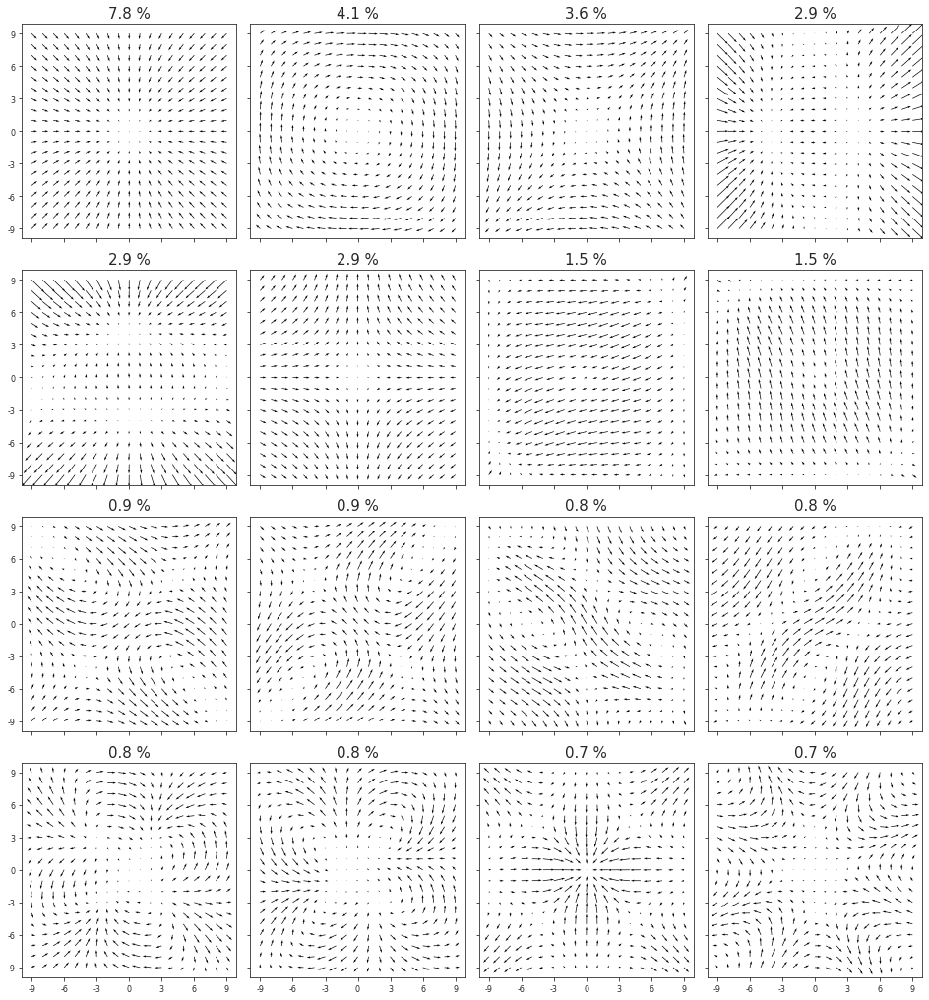

In [129]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

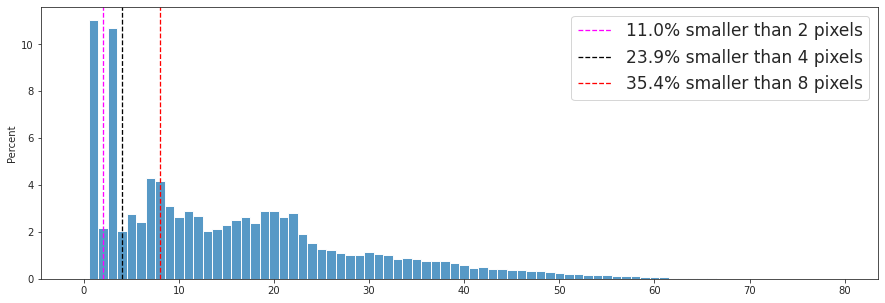

In [130]:
_sizes_hist(of)

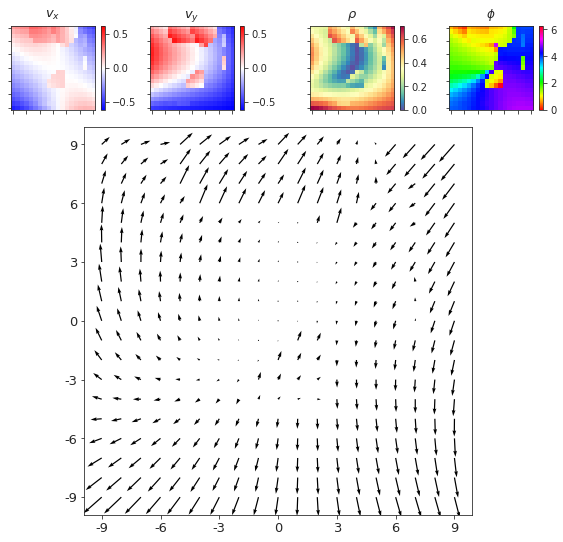

In [131]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

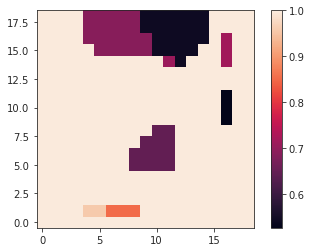

In [132]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][i])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

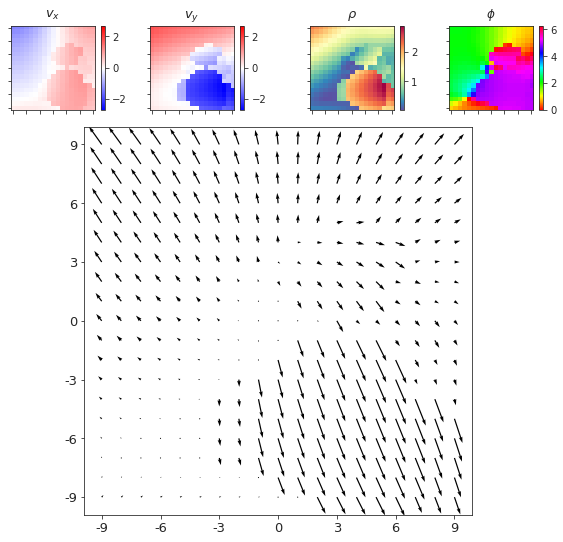

In [133]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

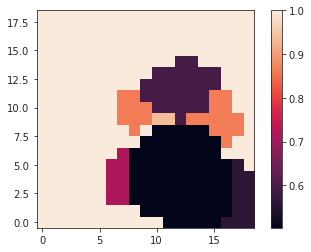

In [134]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][i])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

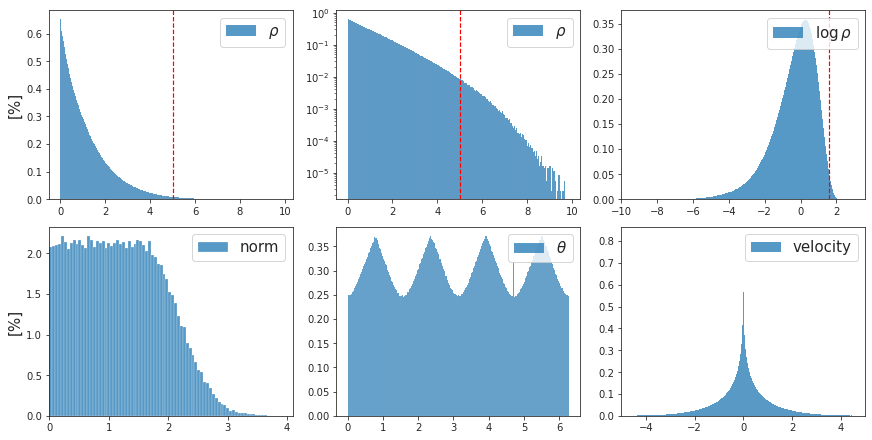

CPU times: user 2min 16s, sys: 20.5 s, total: 2min 37s
Wall time: 2min 37s


In [135]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

## Residual sampling is bad

Create ```fixate``` category with N=4 objects. The distribution of speeds seems weird. Just go with ```residual=False```.

In [136]:
kws['residual'] = True
print(kws)

{
    'dim': 19,
    'fov': 45.0,
    'obj_r': 0.2,
    'obj_bound': 0.97,
    'obj_zlim': (0.5, 1.0),
    'vlim_obj': (0.01, 5.0),
    'vlim_slf': (0.01, 5.0),
    'residual': True,
    'z_bg': 1.0,
    'seed': 0,
    'terrain_phi': 80,
    'terrain_fix': 0.75
}

In [137]:
%%time

of = OpticFlow(
    category='fixate',
    n=int(2e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 6min 48s, sys: 22.7 s, total: 7min 11s
Wall time: 5min 29s


In [138]:
accept.sum()

101864

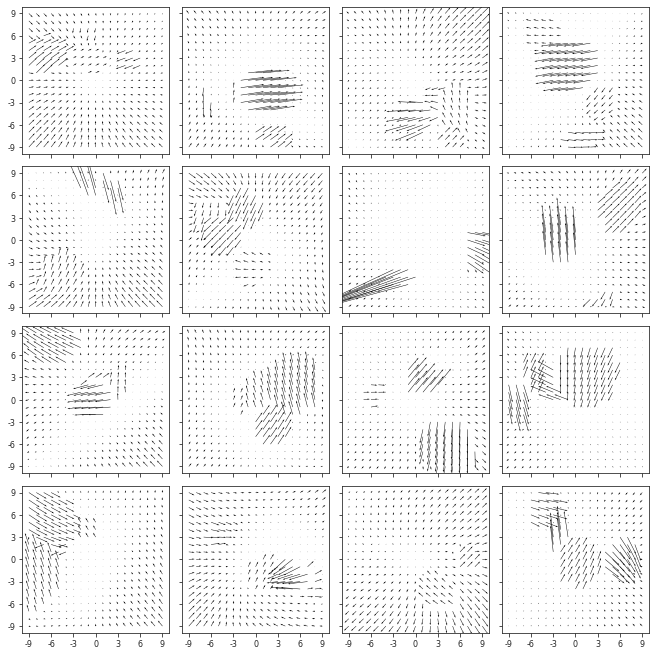

In [139]:
_ = show_opticflow(of.alpha_dot[accept])

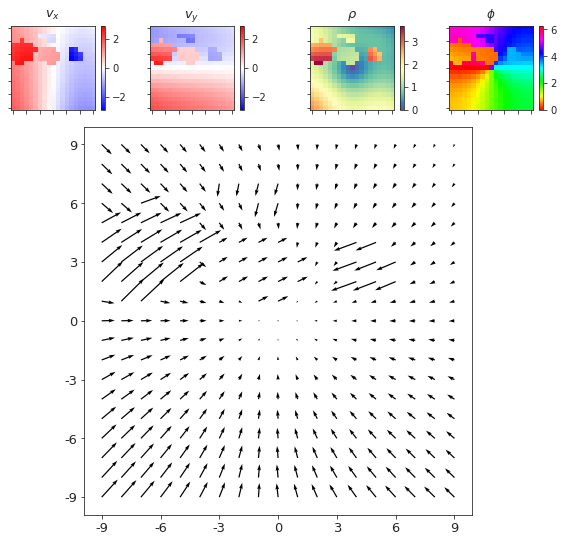

In [140]:
_ = show_opticflow_full(of.alpha_dot[accept][0])

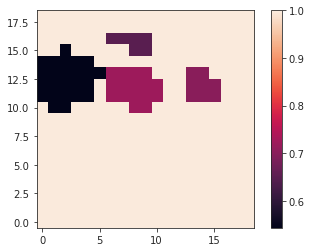

In [141]:
fig, ax = create_figure()
im = ax.imshow(of.z_env[accept][0])
ax.invert_yaxis()
plt.colorbar(im, ax=ax);

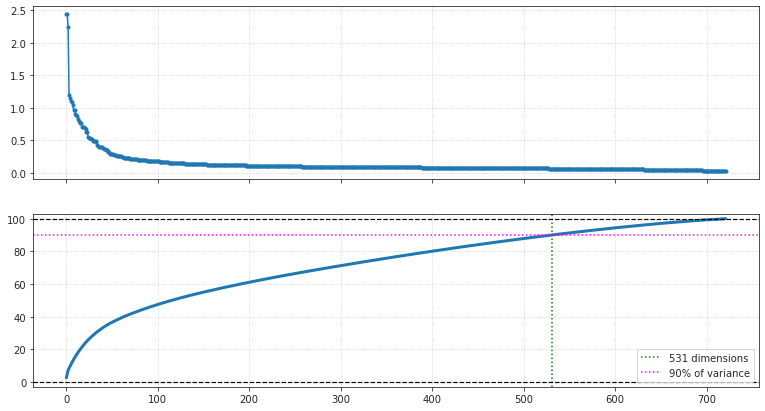

In [142]:
_plot_singular_values(s)

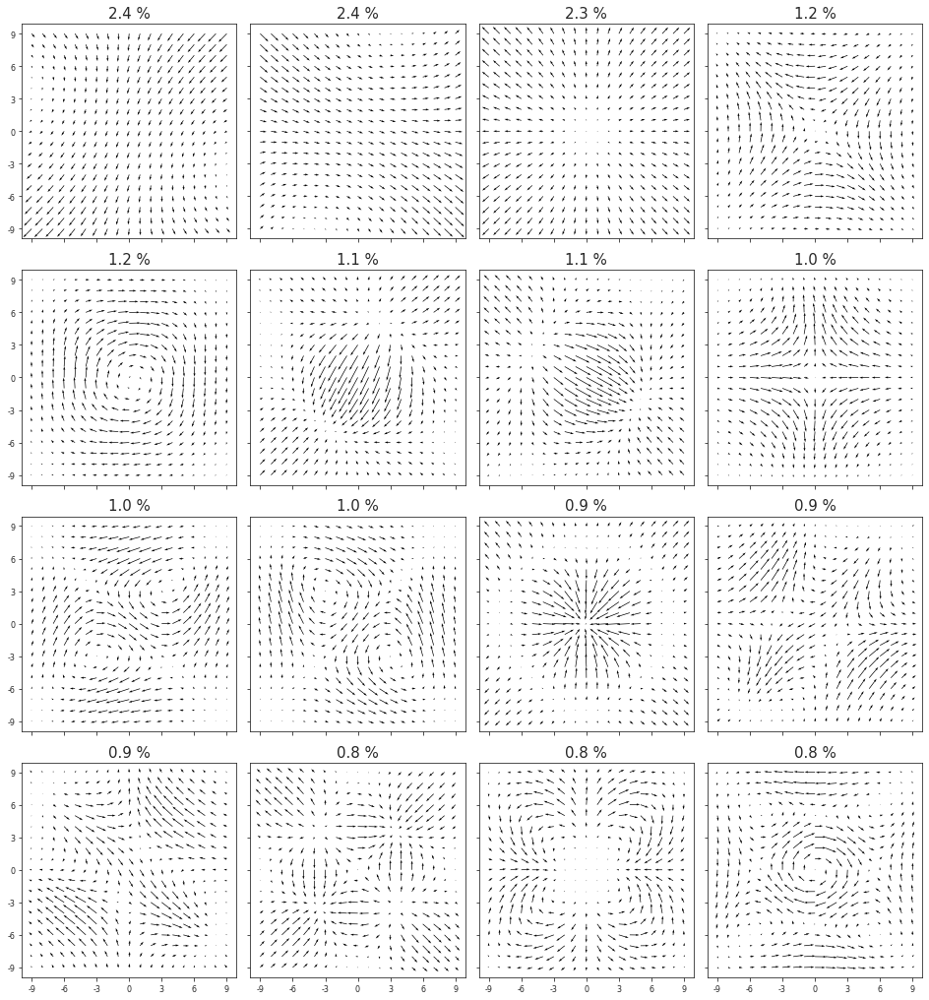

In [143]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

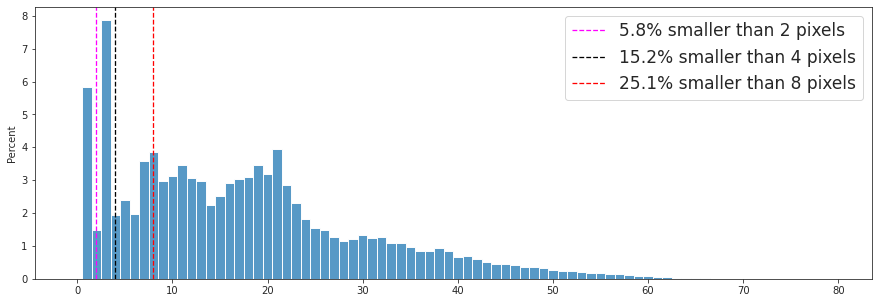

In [144]:
_sizes_hist(of)

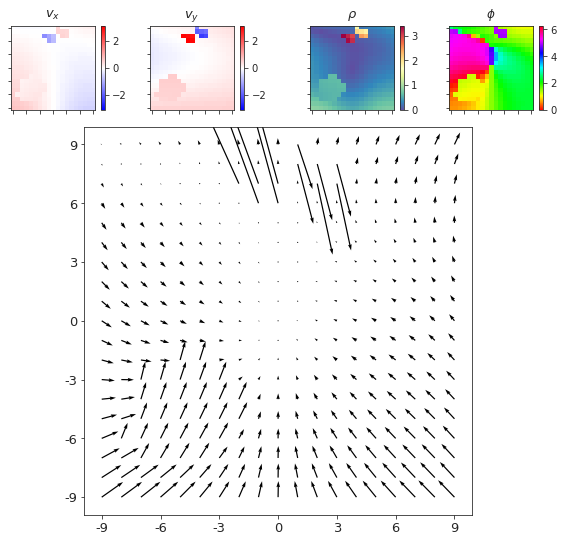

In [145]:
size_pix = of.objects[0].size * of.dim ** 2
i = np.argmin(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

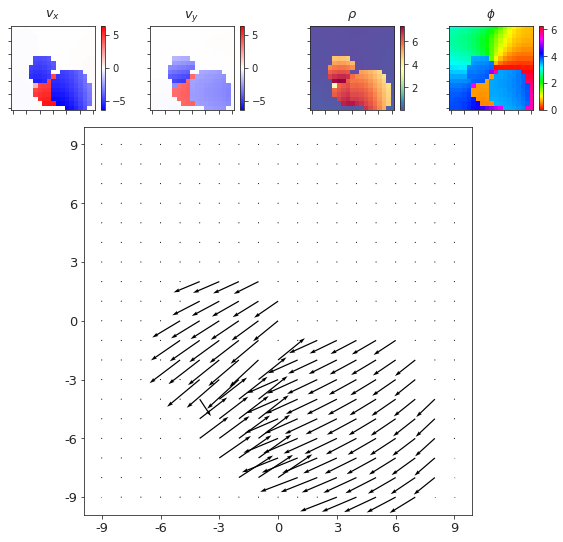

In [146]:
i = np.argmax(size_pix[accept])
_ = show_opticflow_full(of.alpha_dot[accept][i])

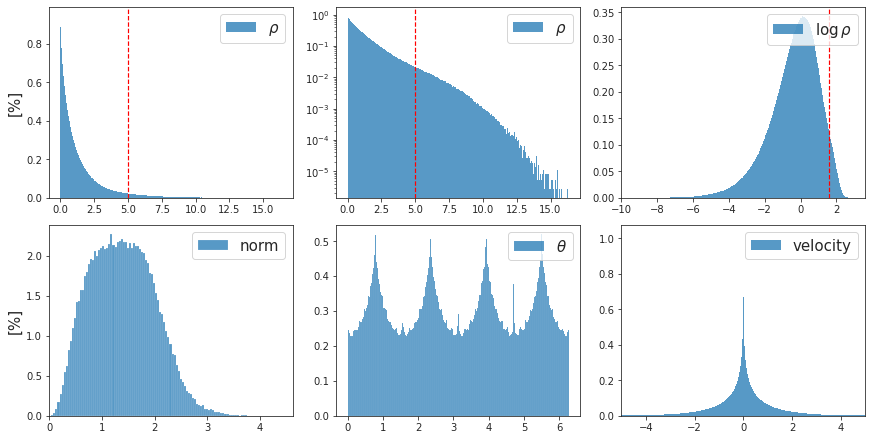

CPU times: user 2min 23s, sys: 19.5 s, total: 2min 42s
Wall time: 2min 42s


In [147]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

---
### Old code to test ```residual=True``` (ignore)
---

***Final decision***: do not use residual sampling. Sample both self and object velocities independently.

In [4]:
%%time

of = OpticFlow(
    category='fixate',
    num=int(1e5),
    n_obj=0,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 2min 9s, sys: 12.5 s, total: 2min 22s
Wall time: 52.6 s


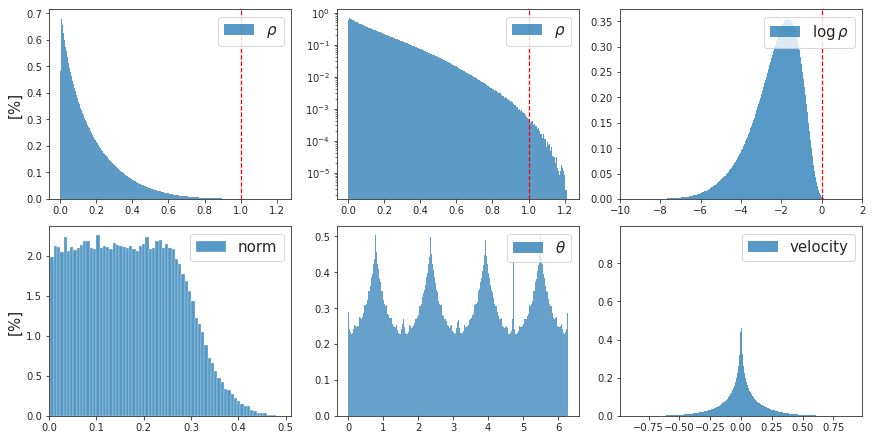

CPU times: user 2min 11s, sys: 19.9 s, total: 2min 31s
Wall time: 2min 30s


In [5]:
%%time

_ = plot_opticflow_hist(of.alpha_dot)

In [6]:
%%time

of = OpticFlow(
    category='fixate',
    num=int(1.3e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 3min 24s, sys: 19.9 s, total: 3min 44s
Wall time: 2min 16s


In [7]:
accept.sum()

107693

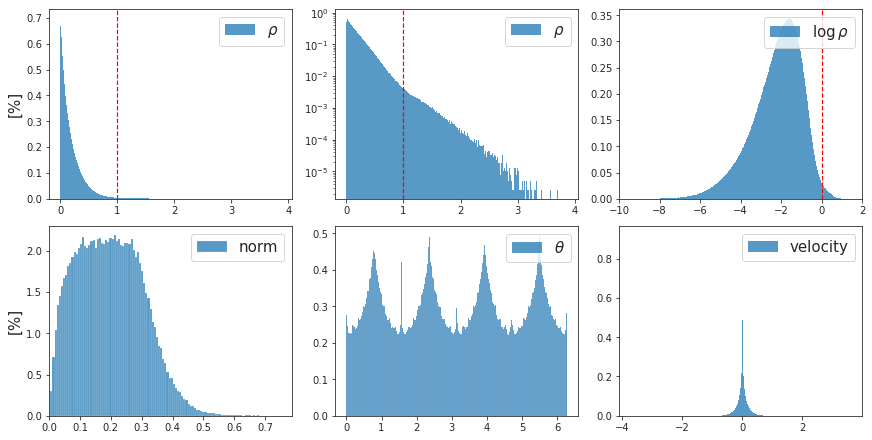

CPU times: user 2min 50s, sys: 26.7 s, total: 3min 16s
Wall time: 3min 14s


In [8]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

In [9]:
%%time

of = OpticFlow(
    residual=True,
    category='fixate',
    num=int(1.3e5),
    n_obj=1,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 3min 28s, sys: 19.5 s, total: 3min 48s
Wall time: 2min 15s


In [10]:
accept.sum()

107693

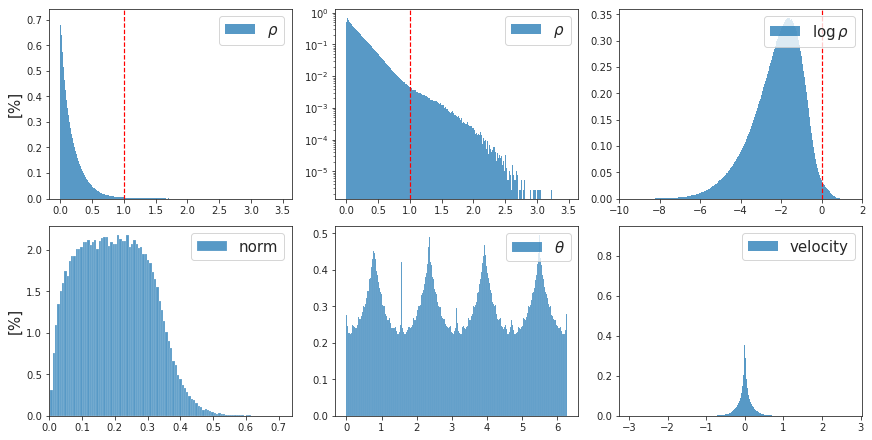

CPU times: user 2min 46s, sys: 26.3 s, total: 3min 12s
Wall time: 3min 11s


In [11]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

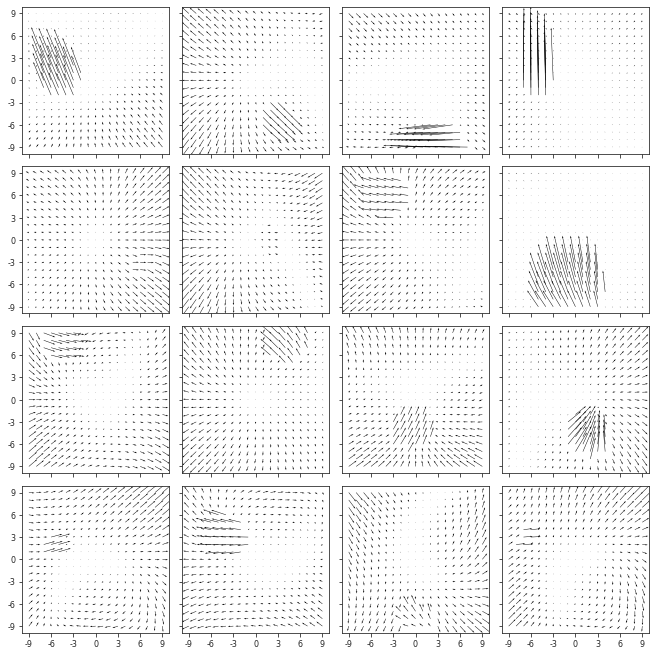

In [12]:
_ = show_opticflow(of.alpha_dot[accept])

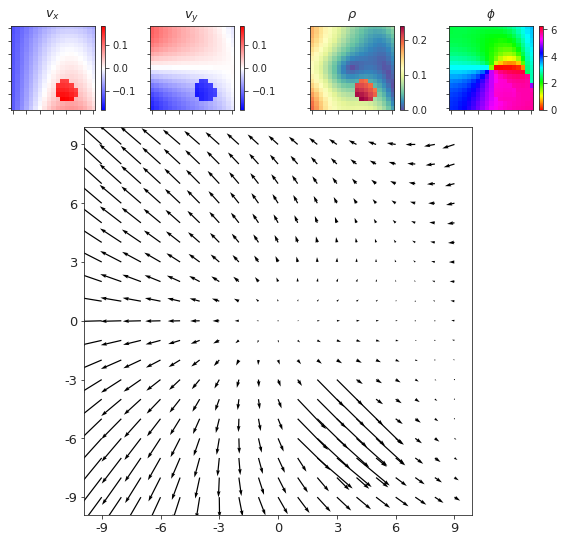

In [13]:
_ = show_opticflow_full(of.alpha_dot[accept][1])

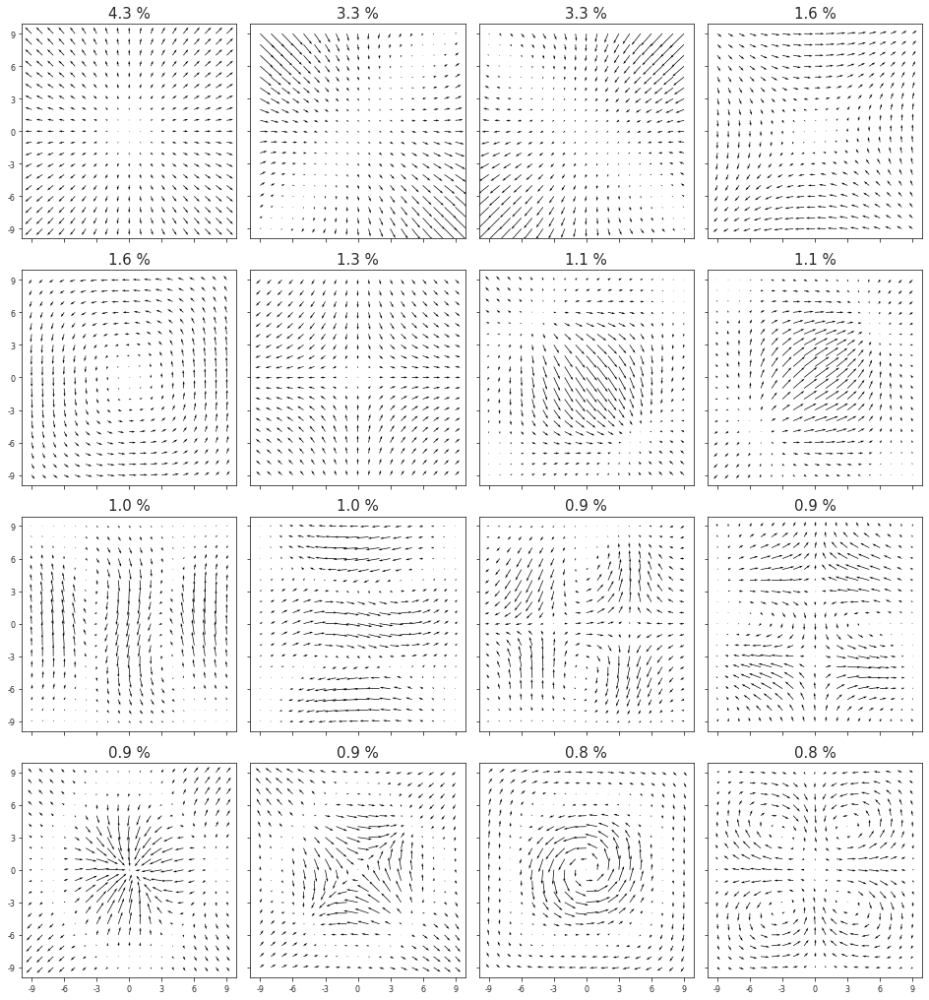

In [14]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

In [4]:
%%time

of = OpticFlow(
    category='fixate',
    num=int(1.5e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 4min 51s, sys: 15.8 s, total: 5min 7s
Wall time: 4min 3s


In [5]:
accept.sum()

76149

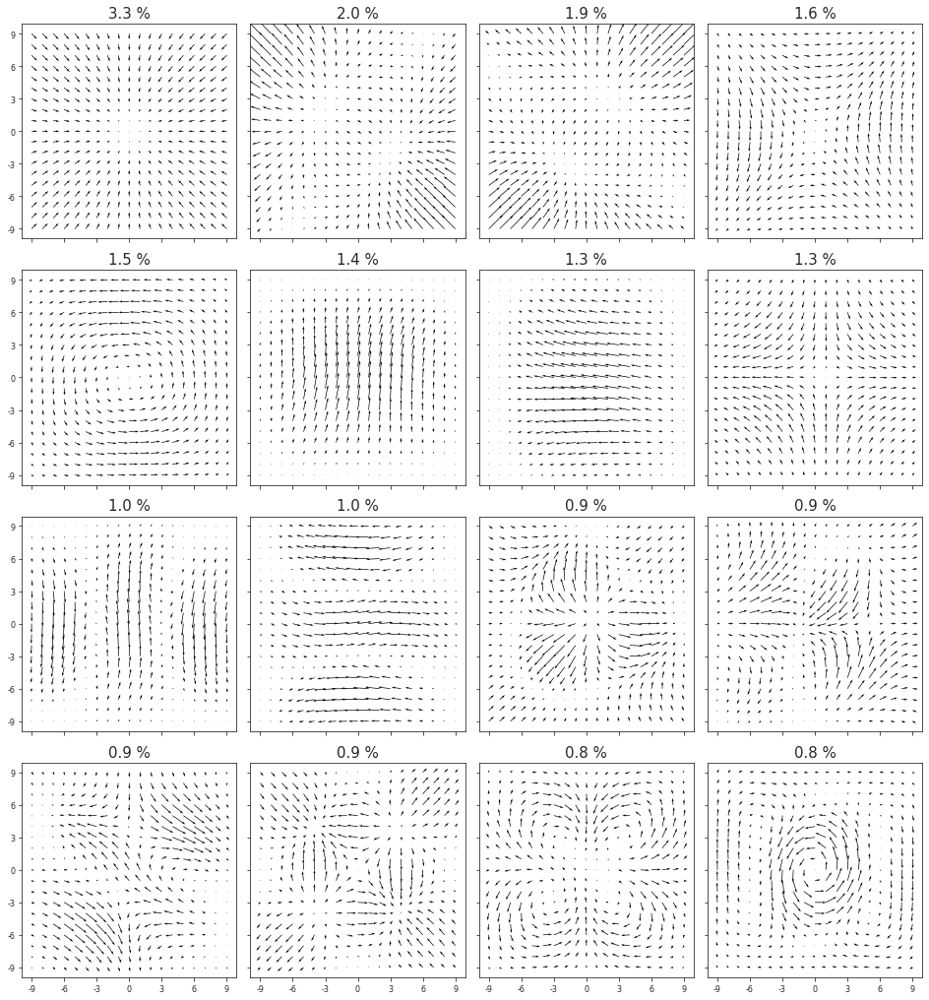

In [6]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));

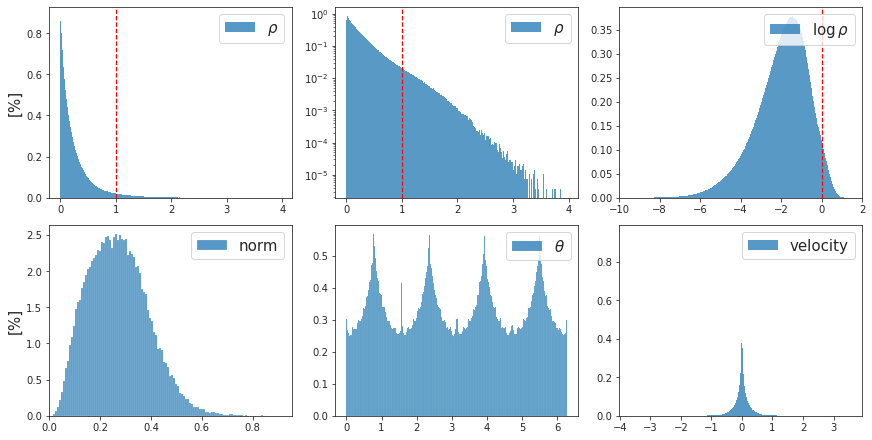

CPU times: user 1min 51s, sys: 14.8 s, total: 2min 6s
Wall time: 2min 6s


In [7]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

In [15]:
%%time

of = OpticFlow(
    residual=True,
    category='fixate',
    num=int(1.5e5),
    n_obj=4,
    **kws,
).compute_coords()
_ = of.compute_flow()
accept = of.filter(min_obj_size)
of.gamma = None

s, pcs, titles = _do_pca(of.alpha_dot[accept])

CPU times: user 4min 46s, sys: 14.7 s, total: 5min
Wall time: 3min 55s


In [16]:
accept.sum()

76149

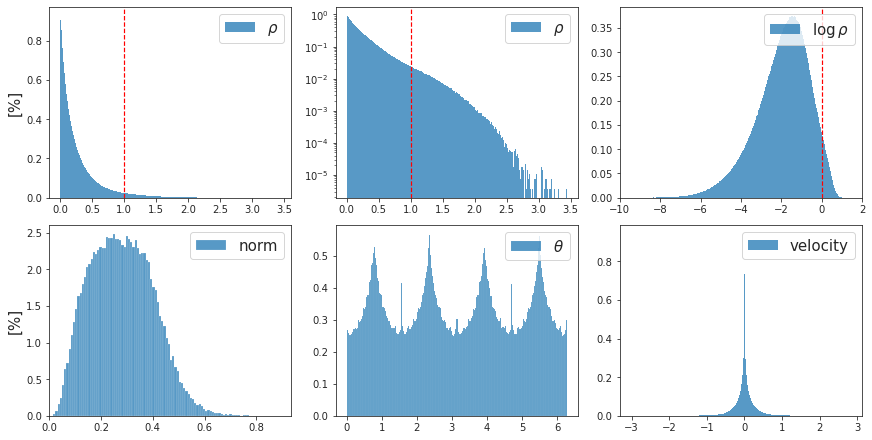

CPU times: user 1min 46s, sys: 14.6 s, total: 2min 1s
Wall time: 2min


In [17]:
%%time

_ = plot_opticflow_hist(of.alpha_dot[accept])

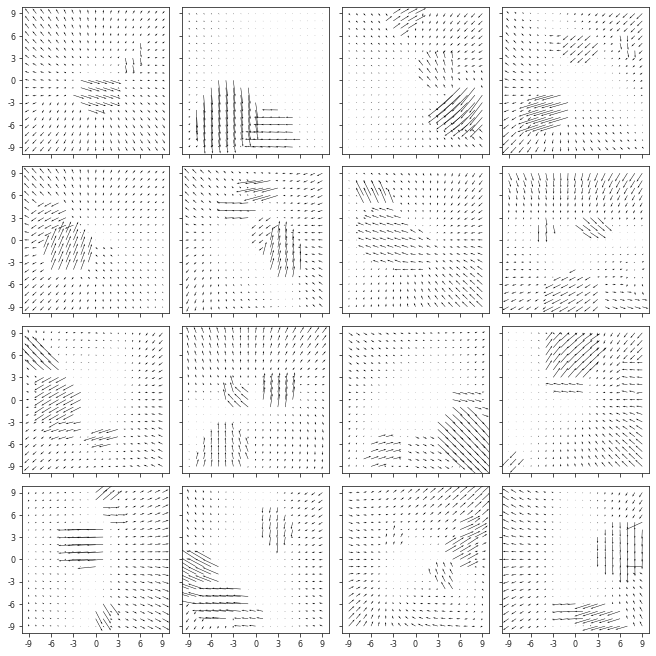

In [18]:
_ = show_opticflow(of.alpha_dot[accept])

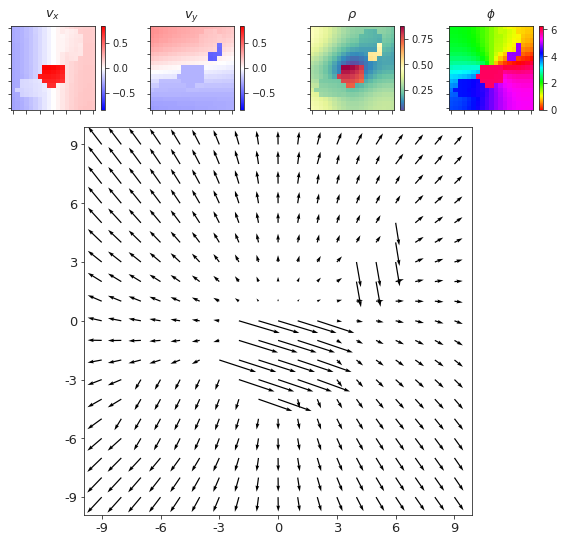

In [28]:
_ = show_opticflow_full(of.alpha_dot[accept][0])

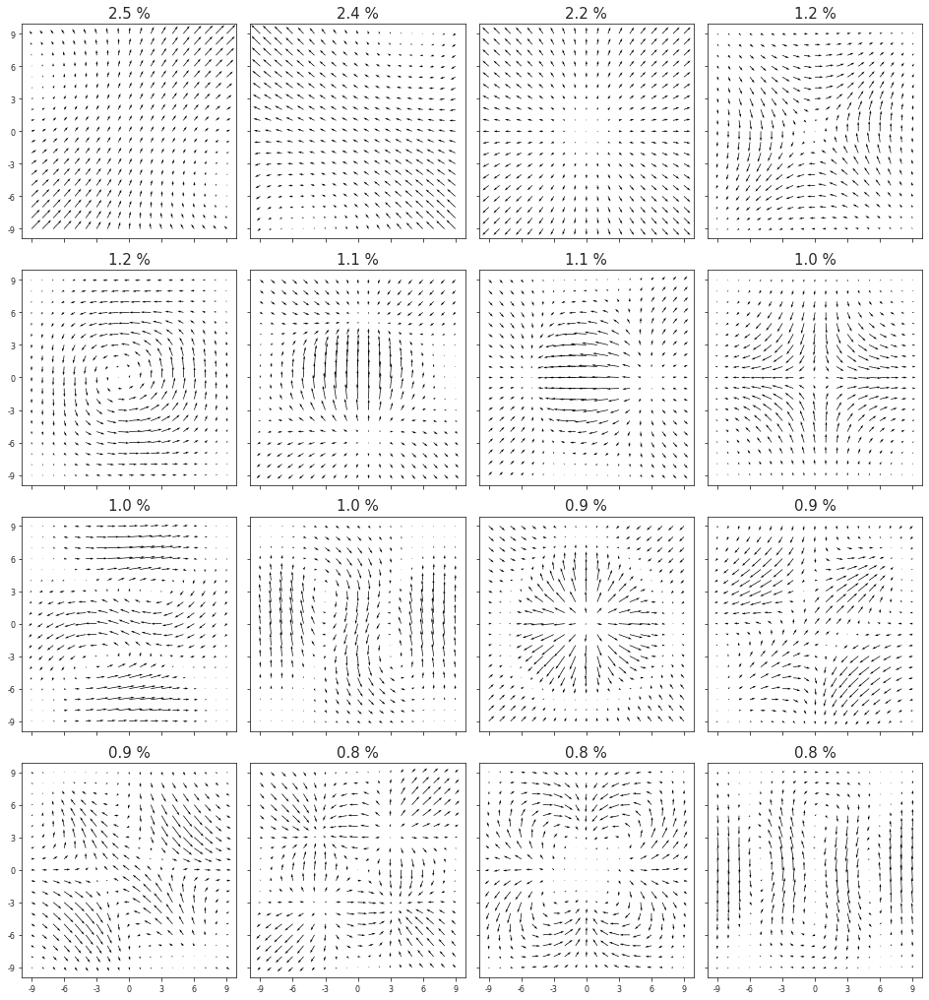

In [22]:
show_opticflow(pcs, num=4, titles=titles, scale=None, figsize=(13, 14));